In [1]:
import pandas as pd
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
from matplotlib import colors
from matplotlib.ticker import MaxNLocator
import matplotlib.ticker as ticker
import matplotlib.dates as mdates
# import matplotlib.ticker as mtick
import seaborn as sns

from src.data_collection import *
from src.constants import *
import urllib.request, json 

C:\Users\dav08\Anaconda3\lib\site-packages\statsmodels\tools\_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


# Viz functions

## Fireplots

In [2]:
# helper for fire plot        
def cell_format(num):
    if -1000 < num < 1000:
        return num
    
    magnitude = 0
    while abs(num) >= 1000:
        magnitude += 1
        num /= 1000.0
    return '%.1f%s' % (num, ['', 'K', 'M', 'G', 'T', 'P'][magnitude])


# fireplot
def fireplot(input_df, country, start_time=None, most_recent=0, save=True, show=False, fontsize=30, labelsize=30, titlesize=56, show_sum=True, split=False, dpi=100):
    # trimming the df
    df = input_df.copy()
    if start_time:
        df = df.iloc[df.index.get_loc(start_time):]
    else:
        df = df.iloc[np.argmax(df.sum(axis=1) >= 3):]
        if most_recent: # so that most_recent and start_time trimming cannot be activated simultaneouly
            df = df.iloc[-most_recent:,:]
    
    df.index = pd.to_datetime(df.index).strftime('%m-%d')
    
    if type(df.index[-1]) != str:
        date = df.index[-1].strftime('%Y-%m-%d')
    else:
        date = df.index[-1]
    
    if split:
        dfs = []
        for i in range(len(df.columns)//split):
            dfs.append(df.iloc[:,i*split : (i+1)*split])
        if len(df.columns) % split:
            dfs.append(df.iloc[:,(i+1)*split : ])
        for i in range(len(dfs)):
            fireplot(dfs[i], country=country+'_'+str(i+1), split=False)
        return
    
    if show_sum:
#         df.insert(loc=-1, column='SUM', value=df.sum(axis=1))
        df.insert(loc=len(df.columns), column='SUM', value=df.sum(axis=1))
#         df['SUM'] = df.sum(axis=1)
        

    # main part, define color boundaries and colors
    w_ratio = 1.5 if df.max().max() < 1000 else 2.5
    fig, ax = plt.subplots(figsize=(int(df.shape[1]*w_ratio), df.shape[0]))

    cmap = colors.ListedColormap(['#38d738','#ffff00','#ff9900','#b45f06','#ff0000','#741b47'])
    bounds=[-100000,0.5,9.5,29.5,99.5,999.5,100000]
    norm = colors.BoundaryNorm(bounds, cmap.N)
    im = ax.imshow(df.fillna(0).values, cmap=cmap, norm=norm)

    # tick labels
    ax.set_xticks(np.arange(len(df.columns)))
    ax.set_yticks(np.arange(len(df.index)))
    ax.set_xticklabels(df.columns)
    ax.set_yticklabels(df.index)
    plt.setp(ax.get_xticklabels(), rotation=90, ha='right', va='center', rotation_mode="anchor")
    
    # annotate, font color by cell bolor
    for i in range(len(df.index)):
        for j in range(len(df.columns)):
            cell = df.fillna(0).values[i, j]
            if cell:
                cell_c = 'w' if (cell >= 1000 or cell < 0) else 'k'
                cell_s = fontsize if (cell < 1000) else int(fontsize * 0.8)
                text = ax.text(j, i, cell_format(cell),
                               ha='center', va='center', color=cell_c, fontsize=cell_s)

#     ax.set_title('%s Fireplot'%country, fontsize=titlesize)
    ax.tick_params(labelsize=labelsize)
    fig.tight_layout()
    
    # output
    if save:
        plt.savefig('figures/Fire_%s.png'%(country+'_'+date), dpi=dpi)
    if not show:
        plt.close()
    print('%s fireplot generated %s'%(country, date))
    
    
def relative_fireplot(input_df, country, save=True, show=False, total_filter=0, dpi=100, fontsize=20):
    df = input_df.copy()
    df = df.iloc[np.argmax(df.sum(axis=1)>10):]
    if total_filter > 0:
        f = df.sum()
        df = df[f[f > total_filter].index]
    
    mean = df.copy()
    mean.index = pd.to_datetime(df.index).strftime('%m-%d')
    date = mean.index[-1]

    for i in list(df):
        mean[i] = df[i].rolling(window=7, min_periods=1, center=True).mean().values
    
    t = (mean.clip(lower=0)/mean.max().clip(lower=1)).T
    t['total'] = df.T.sum(axis=1)
    t = t.sort_values([list(t)[-2], 'total'])
    
    fig, ax=plt.subplots(figsize=(20,len(df)//3))
    cmap=sns.color_palette('RdYlGn_r', 20)
    sns.heatmap(t.iloc[:,:-1], vmin=0, vmax=1, cmap=cmap, cbar=False, xticklabels=len(t.columns)//12, ax=ax)


    ax.tick_params(left=False, labelleft=False, right=True,labelright=True,rotation=0)
    ax.set_xlabel('')
    ax.set_ylabel('')
    ax.tick_params(axis='y',labelsize=fontsize)
    ax.tick_params(axis='x',labelsize=20)
    plt.tight_layout()

        # output
    if save:
        plt.savefig('figures/Fire_relative_%s.png'%(country+'_'+date), dpi=dpi)
    if not show:
        plt.close()
    print('%s relative fireplot generated %s'%(country, date))

## Regional line plots

In [3]:
def lineplots_states(input_df, country, total=False, annots=0, cut_tail=False, log_scale=True, savefig=True, roof=False, bottom=1):
    df = input_df.copy()
    df.index = pd.to_datetime(df.index).strftime('%m-%d')
    if cut_tail:
        df = df.iloc[:-cut_tail]
    
    fig, ax=plt.subplots(nrows=1, ncols=1, figsize=(16,9))    
    for i,state in enumerate(df.columns):
        ax.plot(df[state], 'o', c='C'+str(i), lw=1, markersize=4, alpha=0.2)
        t = df[state].rolling(window=7, min_periods=1, center=True).mean().clip(lower=1)
        ax.plot(t, c='C'+str(i))
        if i < annots:
            ax.annotate(state, xy=(len(df),t[-1]), va='center',ha='left', color='C'+str(i), size=20, alpha=0.8)

    ax.tick_params(labelsize=20)
    ax.xaxis.set_major_locator(plt.MaxNLocator(15))
    ax.format_xdata = mdates.DateFormatter('%m-%d')
    ax.set_xlim(right=len(df)+6)
    if roof:
        ax.set_ylim(top=roof)
    if log_scale:
        ax.set_yscale('log',basey=2)
        ax.set_ylim(bottom=bottom)
    else:
        ax.set_ylim(bottom=bottom)
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)
    ax.spines['bottom'].set_visible(False)
    
    ax.set_ylabel('Daily cases in %s'%country, fontsize=24)
    ax.grid(alpha=0.5)
    plt.tight_layout()
    if savefig:
        plt.savefig('figures/Country_regions_%s.png'%(country+'_'+df.index[-1]), dpi=100)

In [4]:
def lineplots_states(input_df, country, total=False, annots=0, cut_tail=False, log_scale=True, savefig=True, roof=False, bottom=1):
    df = input_df.copy()
    df.index = pd.to_datetime(df.index).strftime('%m-%d')
    if cut_tail:
        df = df.iloc[:-cut_tail]
    
    fig, ax=plt.subplots(nrows=1, ncols=1, figsize=(16,9))    
    for i,state in enumerate(df.columns):
        ax.plot(df[state], 'o', c='C'+str(i), lw=1, markersize=4, alpha=0.2)
        t = df[state].rolling(window=7, min_periods=1, center=True).mean().clip(lower=1)
        ax.plot(t, c='C'+str(i))
        if type(annots) == int and i < annots:
            ax.annotate(state, xy=(len(df),t[-1]), va='center',ha='left', color='C'+str(i), size=20, alpha=0.8)
        if type(annots) == list and (i in annots or state in annots):
            ax.annotate(state, xy=(len(df),t[-1]), va='center',ha='left', color='C'+str(i), size=20, alpha=0.8)

    ax.tick_params(labelsize=20)
    ax.xaxis.set_major_locator(plt.MaxNLocator(15))
    ax.format_xdata = mdates.DateFormatter('%m-%d')
    ax.set_xlim(right=len(df)+6)
    if roof:
        ax.set_ylim(top=roof)
    if log_scale:
        ax.set_yscale('log',basey=2)
        ax.set_ylim(bottom=bottom)
    else:
        ax.set_ylim(bottom=bottom)
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)
    ax.spines['bottom'].set_visible(False)
    
    ax.set_ylabel('Daily cases in %s'%country, fontsize=24)
    ax.grid(alpha=0.5)
    plt.tight_layout()
    if savefig:
        plt.savefig('figures/Country_regions_%s.png'%(country+'_'+df.index[-1]), dpi=100)

## Convergent plot

In [5]:
def convergent_plot(df, country, show=False, annots=2, bottom=1/16, save=False):
    mean = df.rolling(window=7, min_periods=1, center=True).mean().astype(int).clip(lower=1)
    mean

    fig, ax = plt.subplots(figsize=(16, 9))
    for i, state in enumerate(list(mean)):
        focus = mean[state].values
        ax.plot(np.array(['4 weeks ago','3 weeks ago','2 weeks ago','1 week ago','now']),
                np.array([focus[-29],focus[-22],focus[-15],focus[-8],focus[-1]]) / focus[-1], 'o-', lw=2/np.log(i+3))
        if i < annots:
            ax.annotate(state, xy=(-0.1, focus[-29]/focus[-1]), c='C'+str(i),fontsize=20,
                   ha='right', va='center', alpha=0.9)

    ax.set_xlim(left=-0.5)
    ax.yaxis.tick_right()
    ax.spines['left'].set_visible(False)
    ax.spines['top'].set_visible(False)
    ax.tick_params(labelsize=20)
    ax.set_ylabel('Weekly average comparing to now',fontsize=20)
    ax.yaxis.set_label_position('right')
    ax.set_yscale('log', basey=2)
    ax.axhspan(ymin=bottom, ymax=1, xmin=0.105, color='brown', alpha=0.15)
    ax.grid()
    if save:
        plt.savefig(r'figures/Convergent_plot_%s.png'%(country+df.index[-1].strftime('%m-%d')), dpi=100)
    if not show:
        plt.close()

# Global

In [6]:
df = pd.read_csv('https://raw.githubusercontent.com/CSSEGISandData/COVID-19/master/csse_covid_19_data/csse_covid_19_time_series/time_series_covid19_confirmed_global.csv')
focus = df.copy().drop(['Lat','Long'], axis=1).set_index(['Country/Region','Province/State'])
confirm = focus.groupby('Country/Region').sum()
confirm.columns = pd.to_datetime(confirm.columns).strftime('%Y-%m-%d')
df = confirm.T.diff()

set_africa = {'South Africa','Algeria','Cameroon','Burkina Faso','Cote d\'Ivoire','Mauritius','Nigeria','Senegal','Ghana',
              'Niger','Congo (Kinshasa)','Kenya','Guinea','Rwanda','Madagascar','Uganda','Congo (Brazzaville)','Togo','Ethiopia','Zambia','Mali','Guinea-Bissau',
              'Eritrea','Tanzania','Benin','Gabon','Equatorial Guinea','Namibia','Angola','Liberia','Seychelles','Mozambique',
              'Eswatini','Zimbabwe','Central African Republic','Chad','Cabo Verde','Mauritania','Sierra Leone','Botswana','Gambia',
              'Malawi','Sao Tome and Principe','Burundi','South Sudan','Western Sahara','Comoros','Lesotho'}
set_america = {'US','Canada','Brazil','Chile','Ecuador','Peru','Mexico','Panama','Dominican Republic','Argentina','Colombia',
               'Costa Rica','Uruguay','Cuba','Honduras','Bolivia','Venezuela','Paraguay','Trinidad and Tobago','Guatemala','El Salvador',
               'Jamaica','Barbados','Bahamas','Guyana','Haiti','Antigua and Barbuda','Dominica','Saint Lucia','Grenada','Suriname',
               'Saint Kitts and Nevis','Belize','Saint Vincent and the Grenadines','Nicaragua',}
set_asia = {'China','Korea, South','Australia','Japan','Malaysia','Philippines','Singapore','New Zealand','Vietnam','Brunei',
            'Cambodia','Mongolia','Fiji','Laos','Papua New Guinea','India','Indonesia','Thailand','Sri Lanka','Bangladesh',
            'Burma','Maldives','Nepal','Bhutan','Timor-Leste','Tajikistan', 'Israel'}
set_europe = {'Spain','Italy','Germany','France','United Kingdom','Switzerland','Belgium','Netherlands','Austria','Portugal',
              'Sweden','Russia','Norway','Ireland','Czechia','Denmark','Poland','Romania','Luxembourg','Serbia','Finland',
              'Greece','Iceland','Ukraine','Croatia','Estonia','Slovenia','Moldova','Lithuania','Armenia','Hungary','Belarus',
              'Bosnia and Herzegovina','Kazakhstan','Azerbaijan','North Macedonia','Bulgaria','Latvia','Andorra','Slovakia',
              'Uzbekistan','Cyprus','Albania','San Marino','Malta','Kyrgyzstan','Montenegro','Georgia','Liechtenstein','Monaco',
              'Holy See','Kosovo'}
set_middle_east = {'Iran','Turkey','Pakistan','Saudi Arabia','United Arab Emirates','Qatar','Egypt','Morocco','Iraq','Bahrain','Kuwait',
                   'Tunisia','Lebanon','Oman','Afghanistan','Jordan','Djibouti','Syria','Libya','Sudan','Somalia','West Bank and Gaza',
                  'Yemen'}


fire = df.fillna(0).astype(int)
fire = fire[fire.sum().sort_values(ascending=False).index]
fire_asia = fire[[i for i in fire.columns if i in set_asia]]
fire_middle_east = fire[[i for i in fire.columns if i in set_middle_east]]
fire_europe = fire[[i for i in fire.columns if i in set_europe]]
fire_africa = fire[[i for i in fire.columns if i in set_africa]]
fire_america = fire[[i for i in fire.columns if i in set_america]]
fire = fire_asia.join(fire_middle_east).join(fire_africa).join(fire_europe).join(fire_america)

# relative_fireplot(fire_asia, country='Asia', total_filter=500)
# relative_fireplot(fire_middle_east, country='Middle_East', total_filter=500)
# relative_fireplot(fire_europe, country='Europe', total_filter=500, fontsize=40)
relative_fireplot(fire_africa, country='Africa', total_filter=500)
# relative_fireplot(fire_america, country='America', total_filter=500)


# fireplot(fire, country='Global')
# relative_fireplot(fire, country='Global', total_filter=1000)

Africa relative fireplot generated 12-28


# Countries

## US

In [8]:
get_Code(get_US)

def get_US():
    df = pd.read_csv('https://raw.githubusercontent.com/nytimes/covid-19-data/master/us-states.csv')
    df = df.pivot(index='date', columns='state', values='cases')
    df = df.diff().fillna(0).astype(int)
    df = df[df.sum().sort_values(ascending=False).index]
    df.index = pd.to_datetime(df.index)
    df.index.rename('US', inplace=True)
    print('US cases by state fetched for %s'%df.index[-1].strftime('%Y-%m-%d'))
    return(df)



In [17]:
df.sum(axis=1) #daily total for US (sanity check)

US
2020-03-11       236
2020-03-12       403
2020-03-13       542
2020-03-14       673
2020-03-15       699
               ...  
2020-12-24    193557
2020-12-25    100994
2020-12-26    216858
2020-12-27    152102
2020-12-28    189044
Length: 293, dtype: int64

US cases by state fetched for 2020-12-28


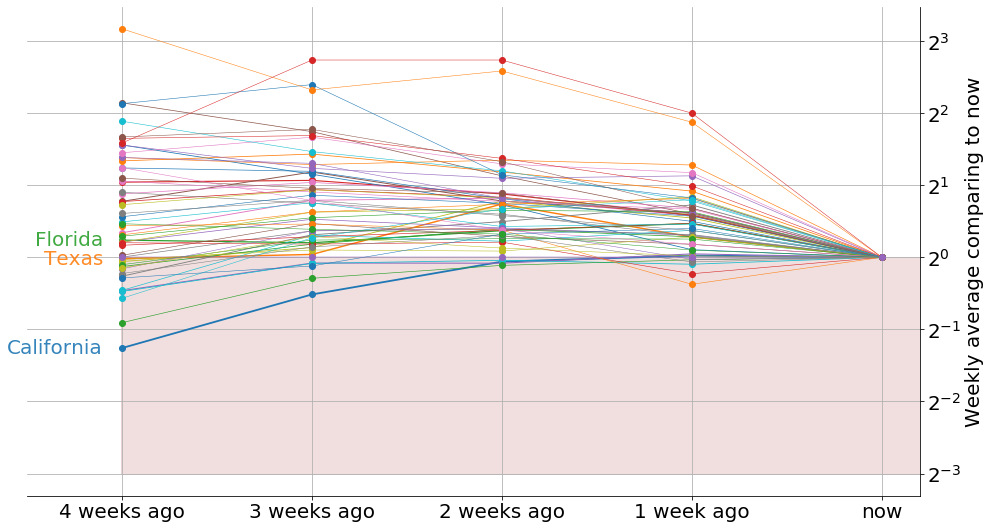

In [30]:
df = get_US()
country = 'US'
df = df[50:]
# df = df[50:][['New York','New Jersey','Illinois','Massachusetts','Pennsylvania','Michigan']]
# df = df[50:].drop(['New York','New Jersey','Illinois','Massachusetts','Pennsylvania','Michigan'], axis=1)


# fireplot(df, country=country, split=0, labelsize=42)
# relative_fireplot(df, country=country, fontsize=40)
#lineplots_states(df, country=country, annots=13, cut_tail=0, log_scale=False, savefig=True, roof=45000)
convergent_plot(df, country, annots=3, show=True, bottom=1/8)

### death

US deaths by state fetched for 2020-12-16


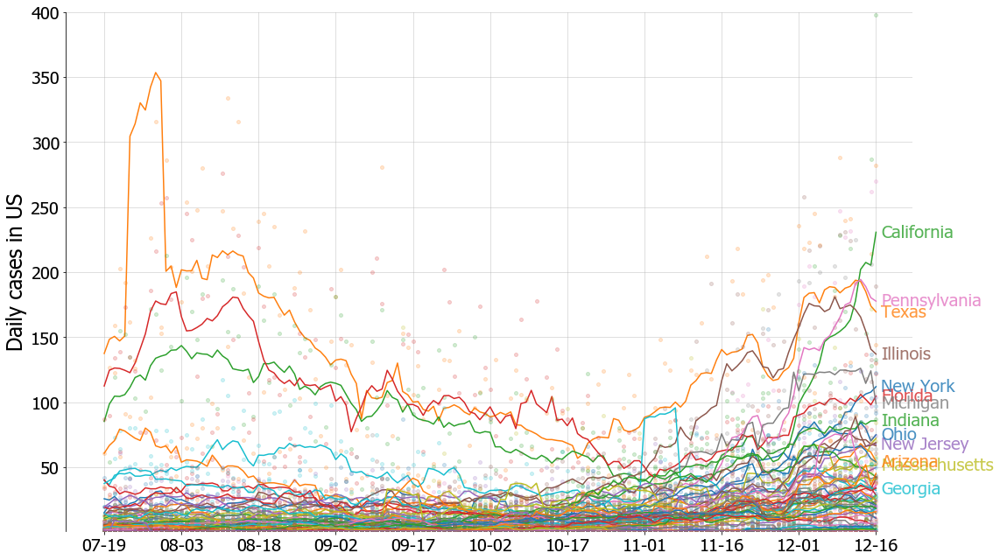

In [44]:
df = get_US_death()
country = 'US'
df = df[180:]

# fireplot(df, country=country, split=0, labelsize=42)
# relative_fireplot(df, country=country)
lineplots_states(df, country=country, annots=13, cut_tail=0, log_scale=False, savefig=True, roof=400)
# convergent_plot(df, country, annots=1, show=True, bottom=1/8)

## Brazil

In [19]:
get_Code(get_Brazil)

def get_Brazil():
    df = pd.read_csv('https://raw.githubusercontent.com/wcota/covid19br/master/cases-brazil-states.csv')
    df = df.pivot_table(index='date',columns='state',values='newCases').fillna(0).drop('TOTAL',axis=1).astype(int)
    df = df[df.sum().sort_values(ascending=False).index]
    df.index = pd.to_datetime(df.index)
    df.index.rename('Brazil', inplace=True)
    print('Brazil cases by state fetched for %s'%df.index[-1].strftime('%Y-%m-%d'))
    return(df)



In [34]:
df.tail()

state,SP,MG,BA,SC,RS,RJ,PR,CE,GO,PA,...,PI,MS,RN,SE,AL,RO,TO,RR,AP,AC
Brazil,,,,,,,,,,,,,,,,,,,,,
2020-12-24,9351,5969,2598,3001,10433,4199,9793,621,272,429,...,215,1291,1058,1223,391,525,240,88,194,239
2020-12-25,3596,4030,1211,1481,2102,603,1586,692,97,18,...,317,290,274,825,258,282,161,42,89,85
2020-12-26,1253,2113,1349,1561,2147,929,1223,33,170,531,...,251,1097,0,445,298,206,149,3,72,13
2020-12-27,2836,1217,1624,1705,823,994,1572,117,63,495,...,253,223,600,777,426,188,121,55,431,164
2020-12-28,1576,1110,748,2182,638,605,2835,638,1890,1086,...,509,1366,955,1058,197,892,384,68,425,110


Brazil cases by state fetched for 2020-12-29


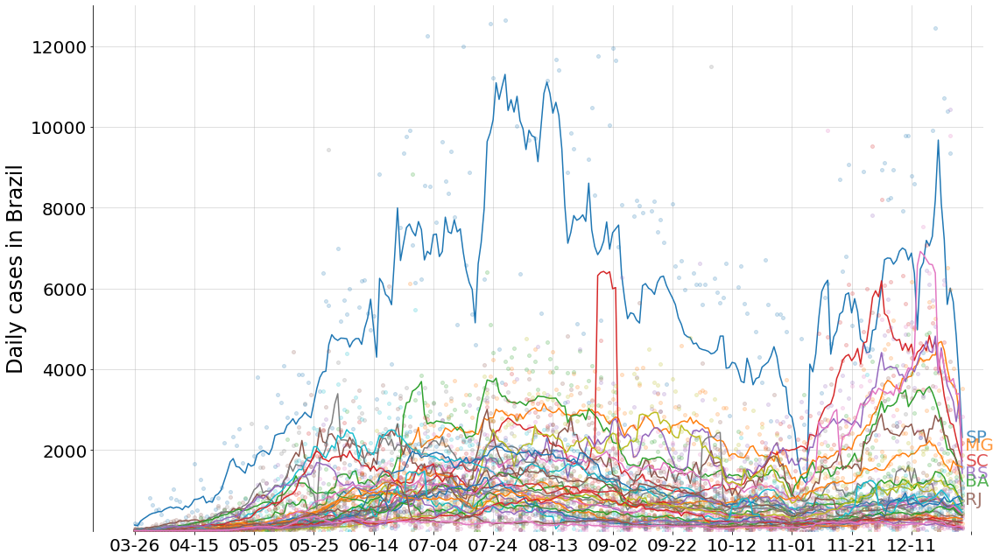

In [35]:
df = get_Brazil()
country = 'Brazil'
df = df[30:-1] # last day often bad data for Brazil

# fireplot(df, country=country, split=0, labelsize=42)
# relative_fireplot(df, country=country)
lineplots_states(df, country=country, annots=6, cut_tail=0, log_scale=False, savefig=True, roof=13000)
# convergent_plot(df, country, annots=4, show=True, bottom=1/8)

## Russia (no longer good data)

In [210]:
# import glob
# files = glob.glob('data/Country detailed/Russia/covid19-russia-data-master/data/*.csv')
# # https://github.com/k0ka/covid19-russia-data
# data = pd.DataFrame()
# for file in files:
#     temp = pd.read_csv(file)
#     temp['date'] = file.split('\\')[1][:10]
#     data = data.append(temp)
    
# df = data.pivot_table(index='date', columns='Region Name', values='Sick').drop('Всего', axis=1)
# df = df.diff().fillna(0).astype(int)
# df = df[df.sum().sort_values(ascending=False).index]
# df.index = pd.to_datetime(df.index)

In [87]:

# df = get_Russia()
# country = 'Russia'
# # df = df.iloc[:,:20]

# # fireplot(df, country=country, split=0, labelsize=42)
# # relative_fireplot(df, country=country)
# lineplots_states(df, country=country, annots=4, cut_tail=0, log_scale=False, savefig=True)
# convergent_plot(df, country, annots=10, show=True, bottom=1/2.3)

In [88]:
df

,Москва,Санкт-Петербург,Московская область,Нижегородская область,Свердловская область,Ростовская область,Красноярский край,Воронежская область,Ханты-Мансийский АО,Архангельская область,...,Курганская область,Республика Адыгея,Камчатский край,Республика Марий Эл,Магаданская область,Чеченская Республика,Севастополь,Еврейская автономная область,Ненецкий автономный округ,Чукотский автономный округ
2020-03-02,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2020-03-03,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2020-03-04,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2020-03-05,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2020-03-06,5,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-12-08,5232,3734,1341,482,382,368,337,379,225,396,...,106,98,80,52,42,142,71,29,3,3
2020-12-09,5145,3761,1372,494,385,372,340,380,222,392,...,109,105,82,53,45,144,74,29,6,2
2020-12-10,6730,3774,1351,499,392,378,336,381,224,407,...,110,101,83,53,44,145,76,27,5,5
2020-12-11,7215,3779,1370,495,402,386,337,378,227,405,...,110,104,80,52,46,143,73,25,7,0


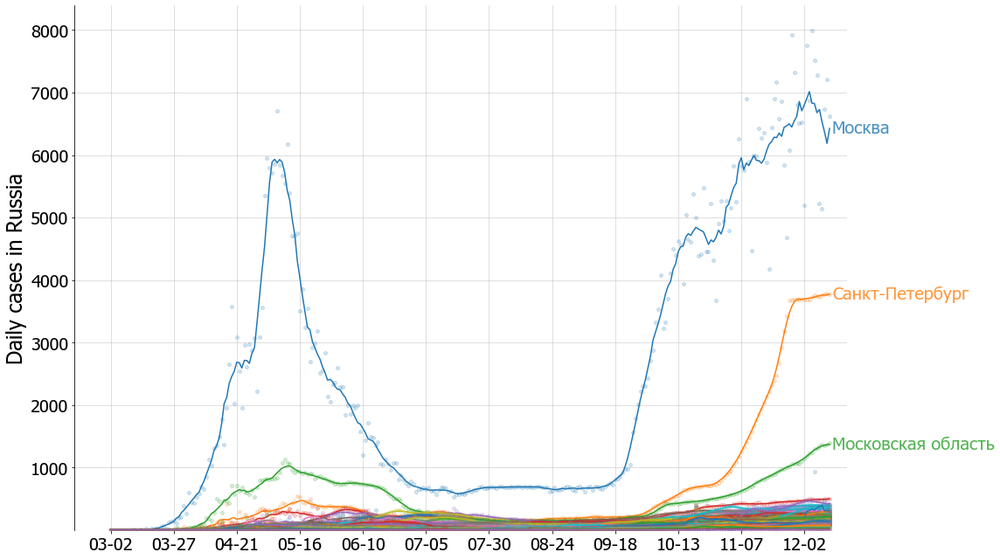

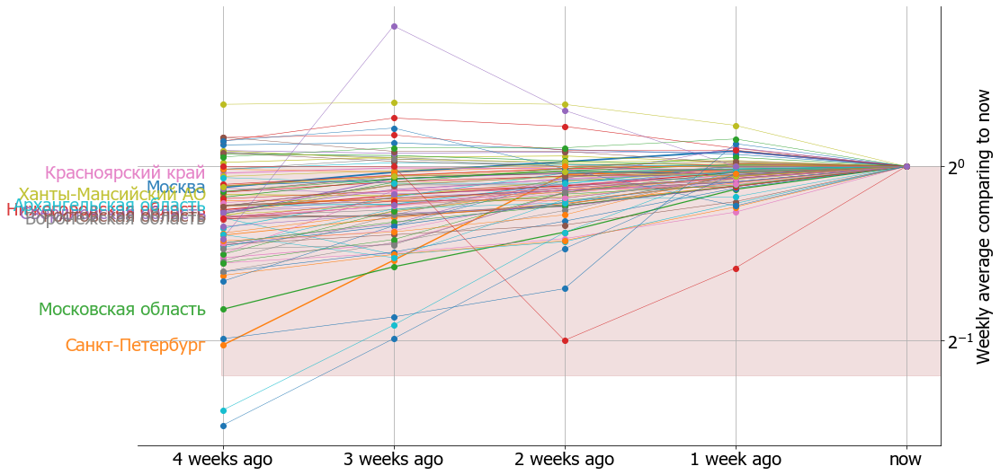

In [174]:
raw = pd.read_json('https://raw.githubusercontent.com/mediazona/data-corona-Russia/master/data.json')
cols = [i['name'] for i in raw.data]
vals = np.array([i['confirmed'] for i in raw.data])
    
df = pd.DataFrame(data=vals.T, columns=cols, index=pd.date_range(start='2020/03/02', periods=vals.shape[1], freq='1D'))
df = df[df.sum().sort_values(ascending=False).index]

country = 'Russia'
# df = df.iloc[:,:20]

# fireplot(df, country=country, split=0, labelsize=42)
# relative_fireplot(df, country=country)
lineplots_states(df, country=country, annots=3, cut_tail=0, log_scale=False, savefig=True)
convergent_plot(df, country, annots=10, show=True, bottom=1/2.3)

## Spain

2020-12-22


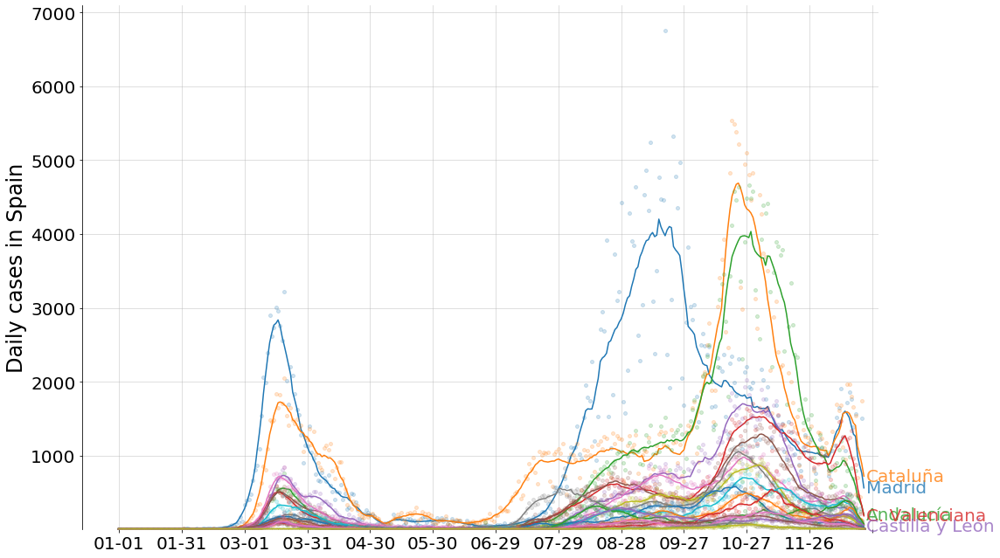

In [36]:
# df = get_Spain()  #(different/old source)

df = pd.read_csv('https://raw.githubusercontent.com/svavassori/covid-19-spain/master/csv/casos-espa%C3%B1a.csv')
df = df.pivot_table(index='fecha', columns='localidad', values='casos')
df = df[df.sum().sort_values(ascending=False).index].drop('España', axis=1)
print(df.index[-1])

country = 'Spain'

# fireplot(df, country=country, split=0, labelsize=42)
# relative_fireplot(df, country=country)
lineplots_states(df, country=country, annots=5, cut_tail=0, log_scale=False, savefig=True,bottom=5)
# convergent_plot(df, country, annots=4, show=True, bottom=1/8)

## Death

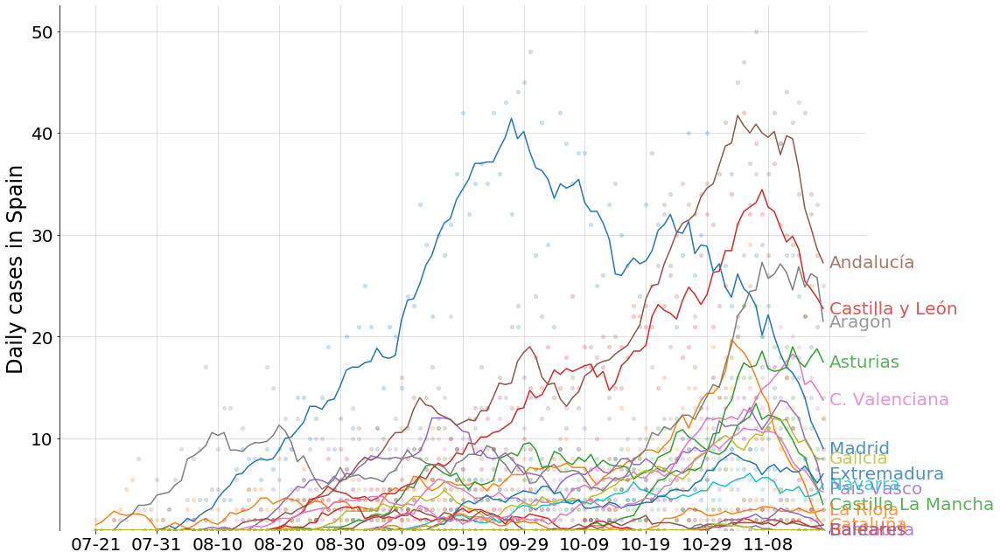

In [38]:
df = pd.read_csv('https://raw.githubusercontent.com/svavassori/covid-19-spain/master/csv/Fallecidos_COVID19.csv')
df = df.set_index('Fecha').drop('España', axis=1)
df.index = pd.to_datetime(df.index)
df = df[df.sum().sort_values(ascending=False).index].diff().fillna(0)
df = df[-120:]
country = 'Spain'

# fireplot(df, country=country, split=0, labelsize=42)
# relative_fireplot(df, country=country)
lineplots_states(df, country=country, annots=15, cut_tail=0, log_scale=False, savefig=True)
# convergent_plot(df, country, annots=4, show=True, bottom=1/8)

## UK

In [41]:
# df = get_UK()

# # fireplot(df, country='UK')
# # relative_fireplot(df, country='UK')
# lineplots_states(df, country='UK', annots=4, cut_tail=0, log_scale=False, savefig=False, roof=200)
# convergent_plot(df, 'UK', annots=1, show=True, bottom=1/3.5)

In [42]:
## https://coronavirus.data.gov.uk/details/download, right hand side, csv(stacked) by reporting date
df = pd.read_csv('data/Country detailed/UK/publishDate_ageDemographic-stacked.csv')
# df = pd.read_csv('https://api.coronavirus.data.gov.uk/v2/data?areaType=overview&metric=cumAdmissionsByAge&format=csv')
df = df.query('age=="overall"').query('areaType=="region"') # ['ltla', 'nation', 'nhsRegion', 'region', 'utla']
df = df.groupby(['date','areaName']).agg('sum').reset_index().pivot_table(index='date',columns='areaName',values='newCasesByPublishDate')
df.index = pd.to_datetime(df.index)
df = df[df.sum().sort_values(ascending=False).index].fillna(0).astype(int)

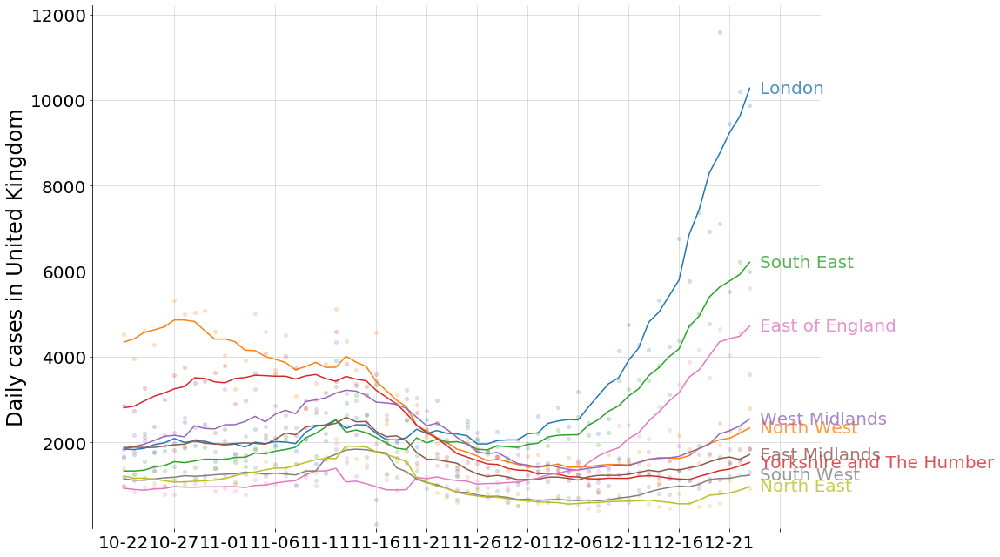

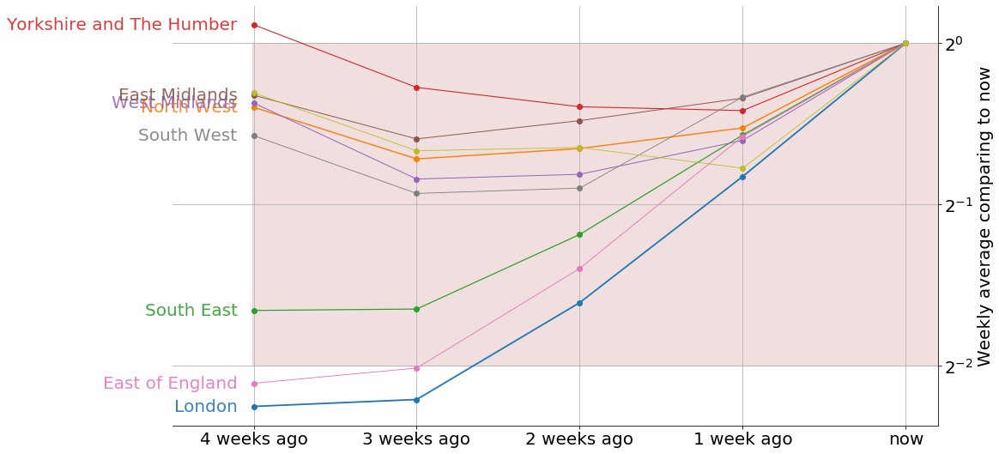

In [43]:
country = 'United Kingdom'

# fireplot(df, country=country, split=0, labelsize=42)
# relative_fireplot(df, country=country)
lineplots_states(df, country=country, annots=12, cut_tail=0, log_scale=False, savefig=True)
convergent_plot(df, country, annots=8, show=True, bottom=1/4)

## Italy

Italy cases by state fetched for 2020-12-29


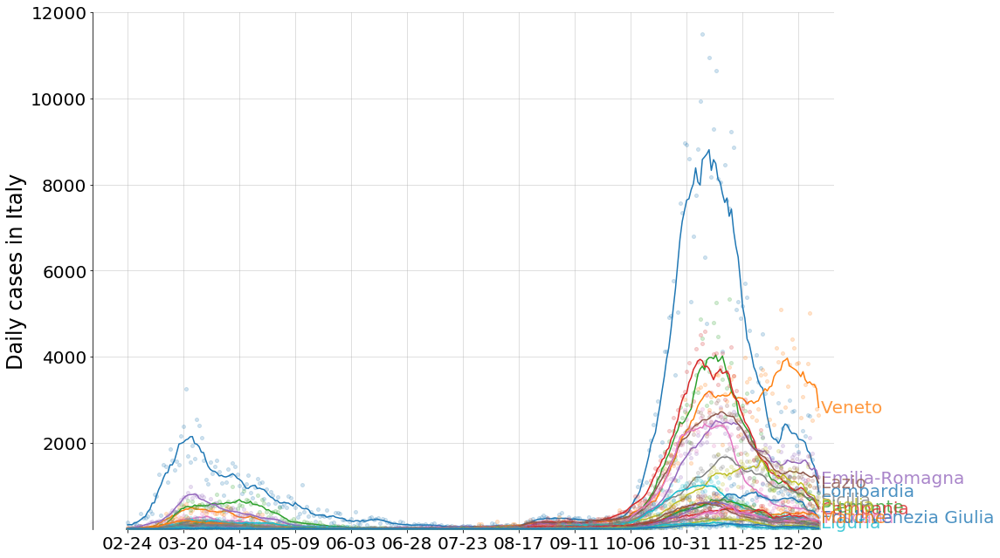

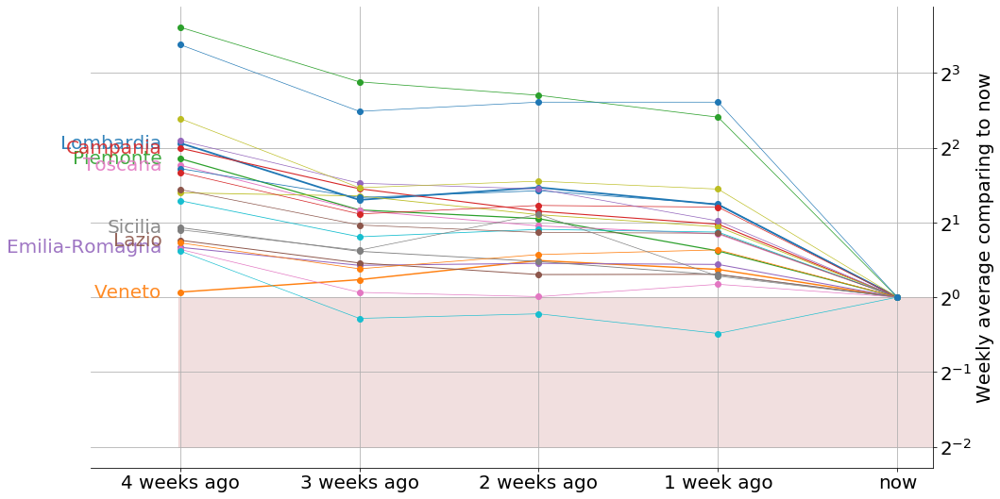

In [44]:
# almost always reliable
df = get_Italy()
country = 'Italy'
# df = df[-90:]

# fireplot(df, country=country, split=0, labelsize=42)
# relative_fireplot(df, country=country)
lineplots_states(df, country=country, annots=12, cut_tail=0, log_scale=False, savefig=True, roof=12000)
convergent_plot(df, country, annots=8, show=True, bottom=1/4)

## India

In [43]:
# outdated
# df = pd.read_csv('https://raw.githubusercontent.com/Kanikaneu/Covid-19/master/India_covid_data.csv')
# df = df.pivot_table(index='Date', columns='Name', values='Total cases')
# df.index = pd.to_datetime(df.index)
# df.sort_index(inplace=True)
# df = df.fillna(0).diff().fillna(0).astype(int)

# lineplots_states(df, country=country, annots=[0,1,2,3,4,5,6,7,'Andhra Pradesh','Karnataka'], cut_tail=0, log_scale=False, savefig=True)

In [42]:
# outdated
# df = get_India()
# country = 'India'
# df = df[:-1]

# # fireplot(df, country=country, split=0, labelsize=42)
# # relative_fireplot(df, country=country)
# lineplots_states(df, country=country, annots=[0,1,2,3,4,5,6,7,'Andhra Pradesh','Karnataka'], cut_tail=0, log_scale=False, savefig=True)
# # convergent_plot(df, country, annots=1, show=True, bottom=1/90)

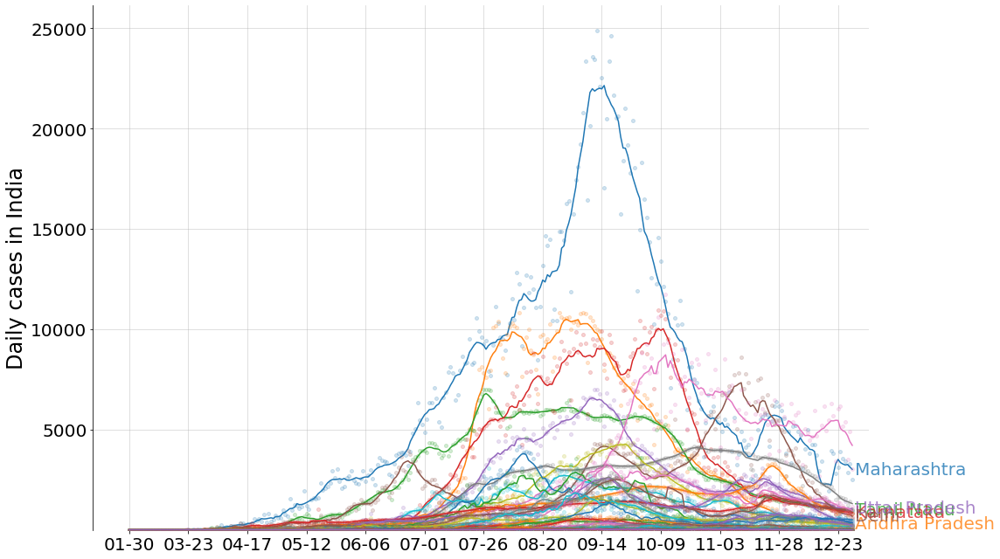

In [47]:
df = pd.read_csv('https://raw.githubusercontent.com/coder-amey/COVID-19-India_Data/master/time-series/India_regional_aggregated.csv')
df = df.pivot(index='Date', columns='Region', values='Confirmed')
df.index = pd.to_datetime(df.index, dayfirst=True, format='%d-%m-%Y')
df.sort_index(inplace=True)
df.drop('National Total', inplace=True, axis=1)
df = df[df.sum().sort_values(ascending=False).index].diff().fillna(0).astype(int)

country = 'India'

# fireplot(df, country=country, split=0, labelsize=42)
# relative_fireplot(df, country=country)
lineplots_states(df, country=country,  annots=[0,1,2,3,4,5,'Andhra Pradesh','Karnataka'], cut_tail=0, log_scale=False, savefig=True)
# convergent_plot(df, country, annots=1, show=True, bottom=1/90)

## Germany

In [111]:
# outdated
# df = get_Germany()
# country = 'Germany'

# # fireplot(df, country=country, split=0, labelsize=42)
# # relative_fireplot(df, country=country)
# lineplots_states(df, country=country, annots=5, cut_tail=0, log_scale=False, savefig=True, bottom=5)
# convergent_plot(df, country, annots=1, show=True, bottom=1/8)

In [50]:
df.sum(axis=1).tail(15)

2020-12-14    19035
2020-12-15    26710
2020-12-16    31170
2020-12-17    31613
2020-12-18    29508
2020-12-19    21577
2020-12-20    13868
2020-12-21    19983
2020-12-22    28645
2020-12-23    33198
2020-12-24    20532
2020-12-25    12935
2020-12-26    11293
2020-12-27     9388
2020-12-28     8104
dtype: int64

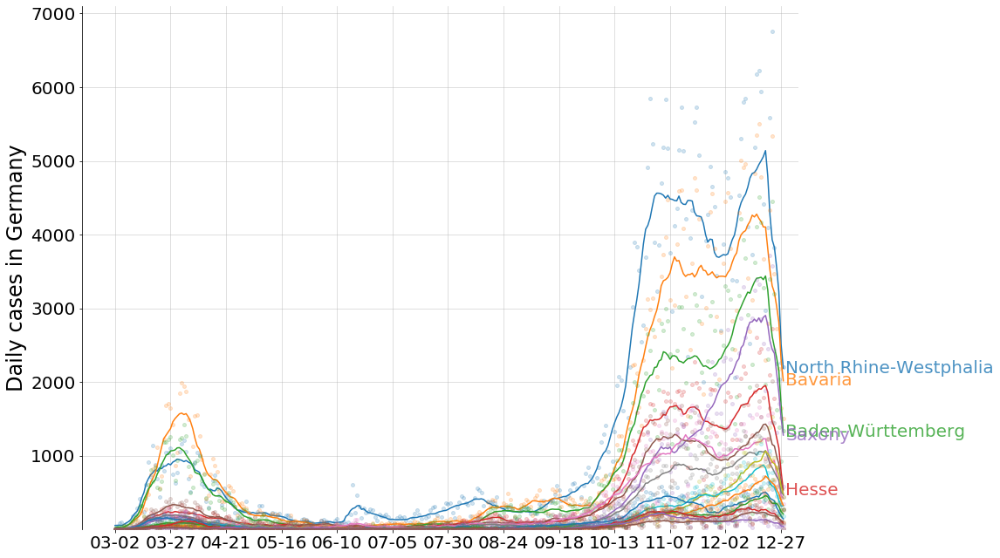

In [54]:
df = pd.read_csv('https://raw.githubusercontent.com/jgehrcke/covid-19-germany-gae/master/cases-rki-by-state.csv').set_index('time_iso8601')
df.index = pd.to_datetime(df.index).date
df.drop('sum_cases', axis=1, inplace=True)
df.columns = [i.split('-')[1] for i in df.columns]
df = df[df.T.sort_values(df.index[-1], ascending=False).index]
df = df.diff().fillna(0).astype(int)
germany_dict = {'BW':'Baden-Württemberg',
                'BY':'Bavaria',
                'BE':'Berlin',
                'BB':'Brandenburg',
                'HB':'Bremen',
                'HH':'Hamburg',
                'HE':'Hesse',
                'NI':'Lower Saxony',
                'MV':'Mecklenburg-Vorpommern',
                'NW':'North Rhine-Westphalia',
                'RP':'Rhineland-Palatinate',
                'SL':'Saarland',
                'SN':'Saxony',
                'ST':'Saxony-Anhalt',
                'SH':'Schleswig-Holstein',
                'TH':'Thuringia',
               }
df.rename(columns=germany_dict, inplace=True)

country = 'Germany'

# # fireplot(df, country=country, split=0, labelsize=42)
# # relative_fireplot(df, country=country)
lineplots_states(df, country=country, annots=5, cut_tail=0, log_scale=False, savefig=True, bottom=5)
# convergent_plot(df, country, annots=1, show=True, bottom=1/8)

## Switzerland

In [ ]:
df.sum(axis=1)

Switzerland cases by state fetched for 2020-12-30


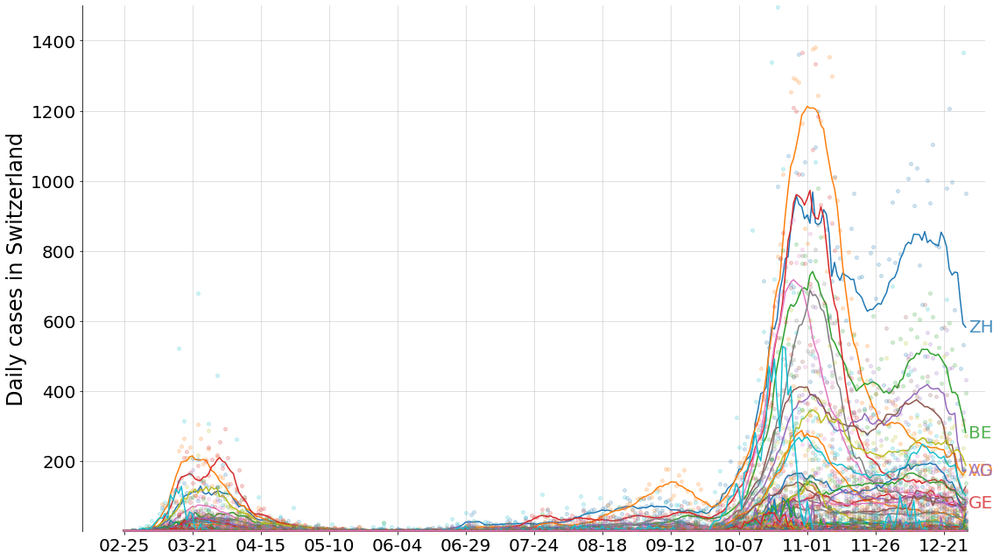

In [6]:
df = get_Switzerland()
country = 'Switzerland'
df = df[:-1]

# fireplot(df, country=country, split=0, labelsize=42)
# relative_fireplot(df, country=country)
lineplots_states(df, country=country, annots=5, cut_tail=0, log_scale=False, savefig=True, roof=1500)
# convergent_plot(df, country, annots=1, show=True, bottom=1/8)

## Mexico

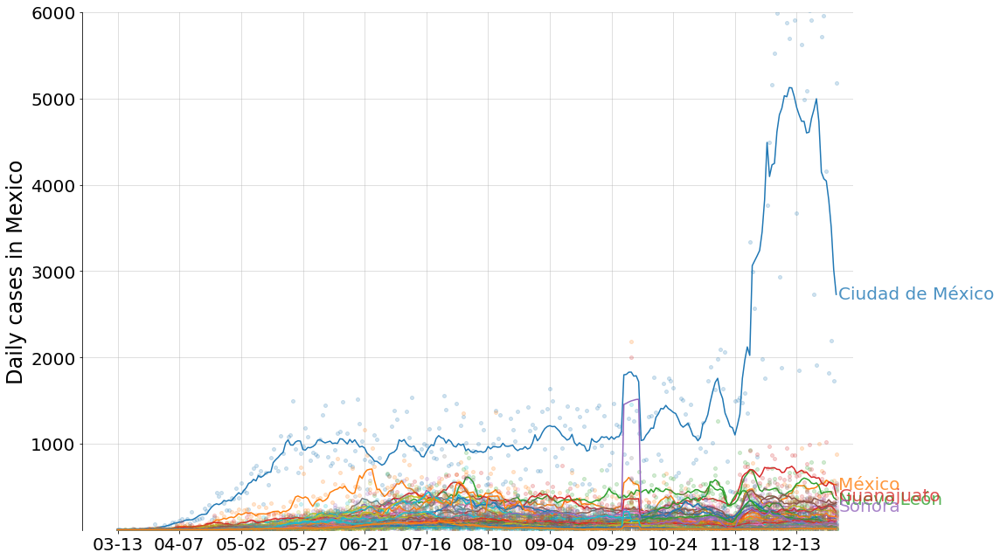

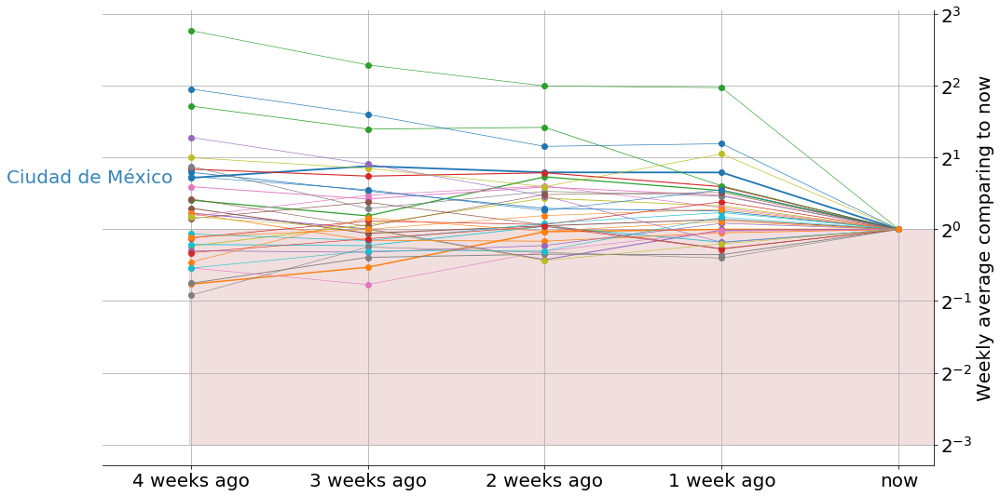

In [8]:
# df = get_Mexico()

df = pd.read_csv('https://raw.githubusercontent.com/mariorz/covid19-mx-time-series/master/data/covid19_confirmed_mx.csv')
df = df.set_index('Estado').T
df = df.rename(index={'02-08-2020.1':'02-09-2020'})
df.index = pd.to_datetime(df.index, dayfirst=True)
df = df.diff().fillna(0).astype(int)
df = df[df.sum().sort_values(ascending=False).index]
df.index.rename('Mexico', inplace=True)


country = 'Mexico'
df = df[50:]

# fireplot(df, country=country, split=0, labelsize=42)
# relative_fireplot(df, country=country)
lineplots_states(df, country=country, annots=5, cut_tail=0, log_scale=False, savefig=True, roof=6000)
convergent_plot(df, country, annots=1, show=True, bottom=1/8)

## Canada

In [13]:
df.tail()

province,Quebec,Ontario,Alberta,BC,Manitoba,Saskatchewan,Nova Scotia,New Brunswick,NL,Nunavut,PEI,Yukon,NWT,Repatriated
Canada,,,,,,,,,,,,,,
2020-12-24,2349,2360,0,582,241,154,7,2,0,1,3,1,0,0
2020-12-25,0,399,0,0,0,0,0,1,0,0,0,0,0,0
2020-12-26,0,1709,0,0,0,0,9,2,0,0,0,0,0,0
2020-12-27,6793,1920,0,0,524,559,3,2,3,0,0,0,0,0
2020-12-28,2265,3873,4488,0,107,0,1,1,2,1,0,0,0,0


Canada cases by state fetched for 2020-12-28


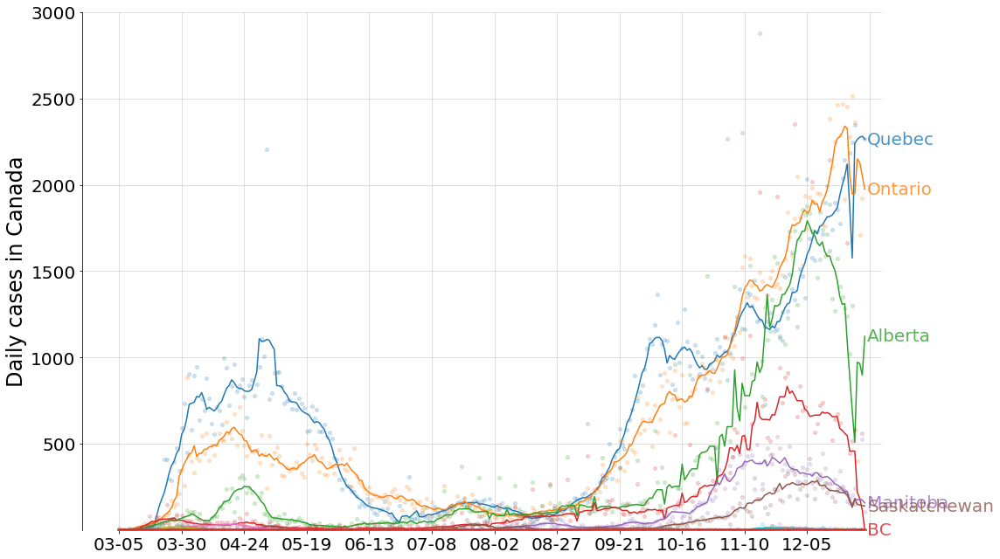

In [12]:
df = get_Canada()
country = 'Canada'

# fireplot(df, country=country, split=0, labelsize=42)
# relative_fireplot(df, country=country)
lineplots_states(df[40:], country=country, annots=6, cut_tail=0, log_scale=False, roof=3000)
# convergent_plot(df, country, annots=1, show=True, bottom=1/8)

## South Africa

South Africa cases by state fetched for 2020-12-28


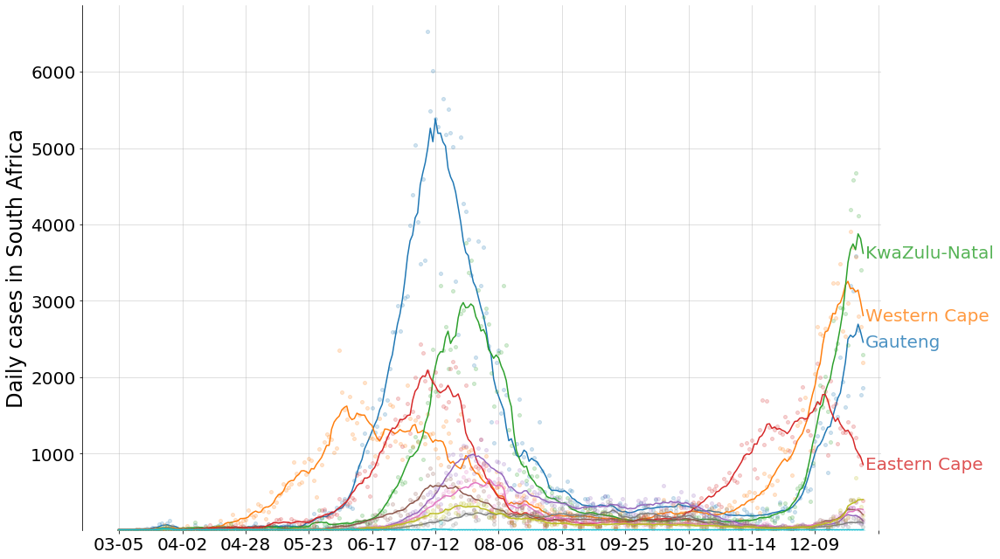

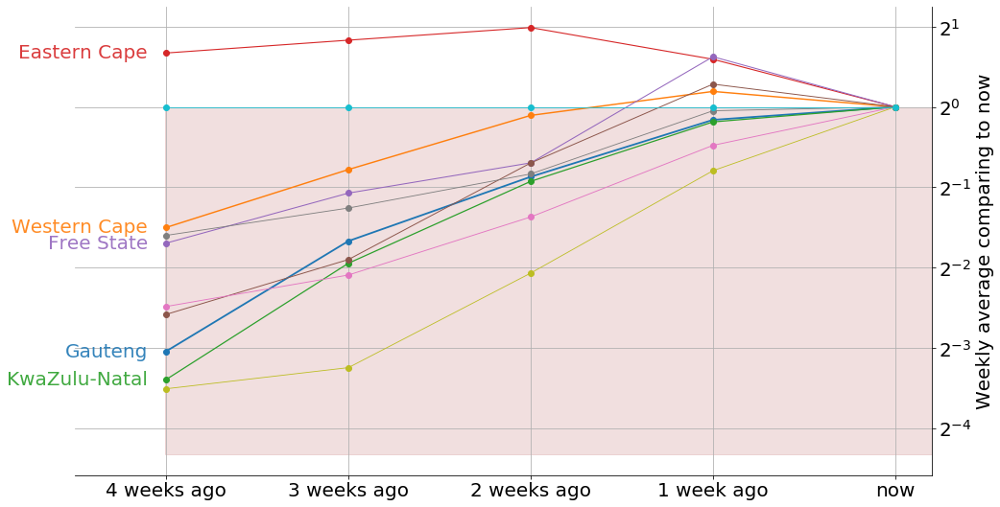

In [14]:
df = get_South_Africa()
country = 'South Africa'

# fireplot(df, country=country, split=0, labelsize=42)
# relative_fireplot(df, country=country)
lineplots_states(df, country=country, annots=4, cut_tail=0, log_scale=False, savefig=True,)
convergent_plot(df, country, annots=5, show=True, bottom=1/20)

## Peru

Peru cases by state fetched for 2020-12-28


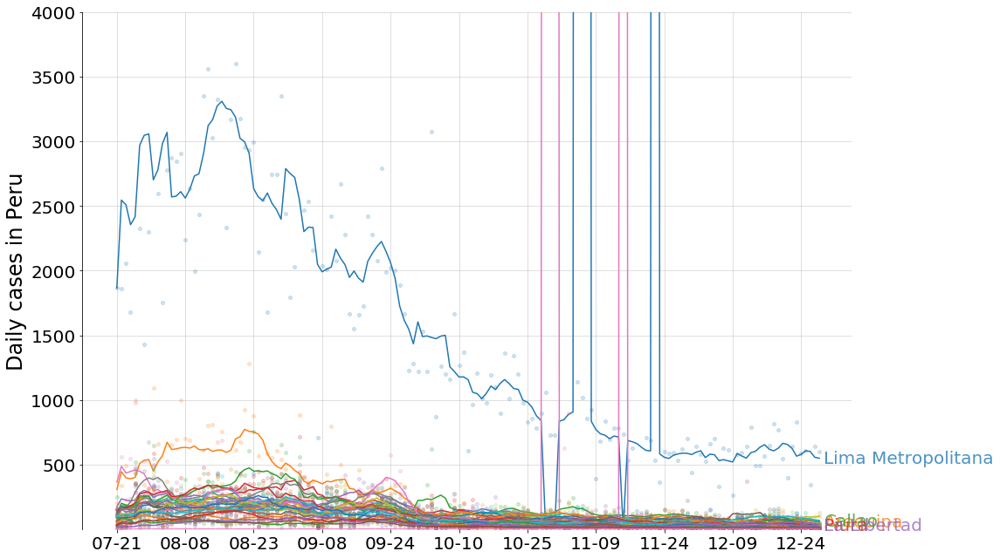

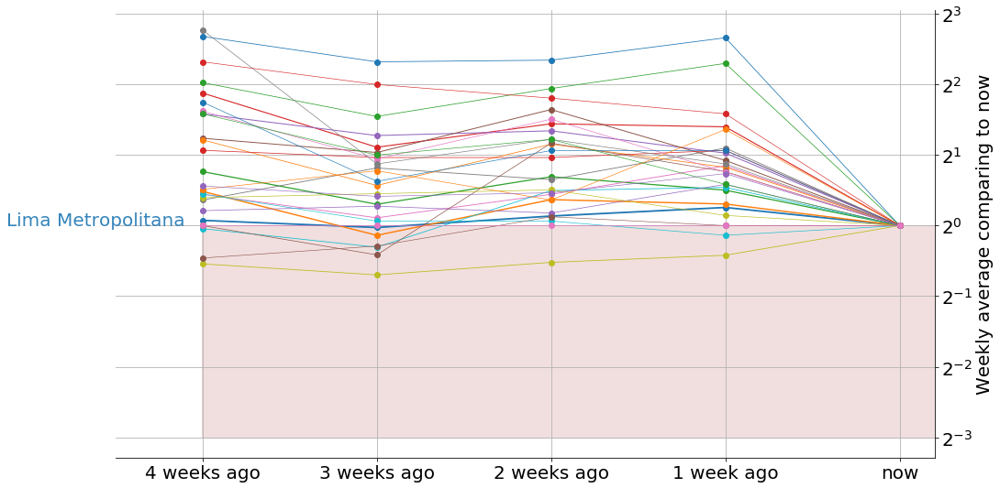

In [18]:
df = get_Peru()
country = 'Peru'
df = df[130:]

# fireplot(df, country=country, split=0, labelsize=42)
# relative_fireplot(df, country=country)
lineplots_states(df, country=country, annots=5, cut_tail=0, log_scale=False, savefig=True, roof = 4000)
convergent_plot(df, country, annots=1, show=True, bottom=1/8)

## Chile

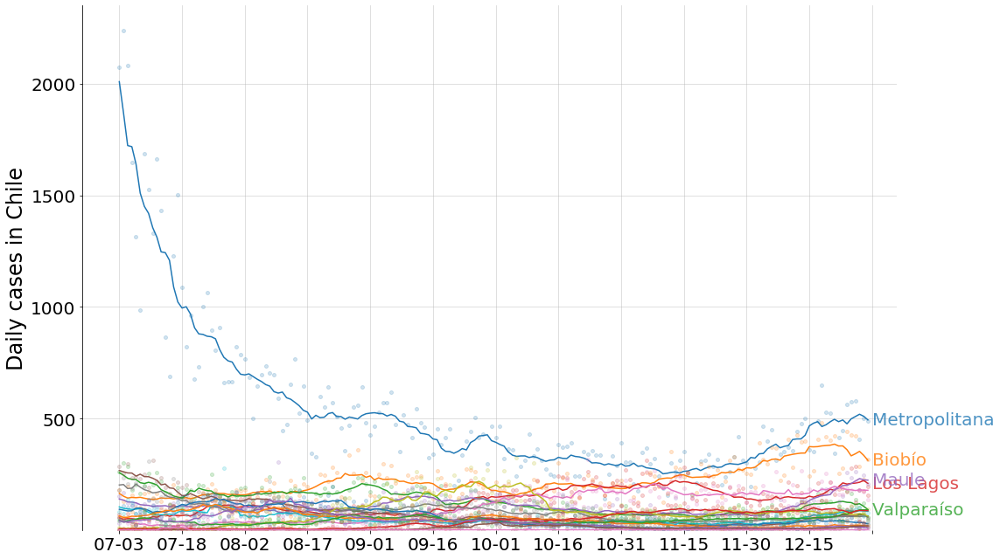

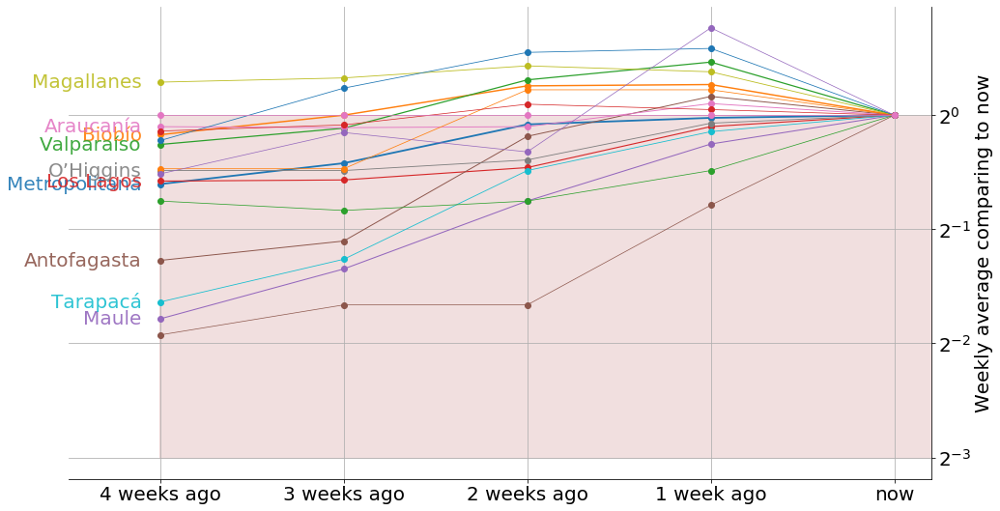

In [19]:
# df = get_Chile()
# country = 'Chile'
df = pd.read_csv('https://raw.githubusercontent.com/ivanMSC/COVID19_Chile/master/covid19_chile.csv')
df = df.pivot_table(index='Fecha', columns='Region', values='Nuevo Confirmado')
df.index = pd.to_datetime(df.index, dayfirst=True)
df.sort_index(inplace=True)
df = df[df.sum().sort_values(ascending=False).index]
df = df[-180:]
country = 'Chile'
# fireplot(df, country=country, split=0, labelsize=42)
# relative_fireplot(df, country=country)
lineplots_states(df, country=country, annots=5, cut_tail=0, log_scale=False, savefig=True,)
convergent_plot(df, country, annots=10, show=True, bottom=1/8)

## Argentina (no good anymore)

Argentina cases by state fetched for 2020-10-18


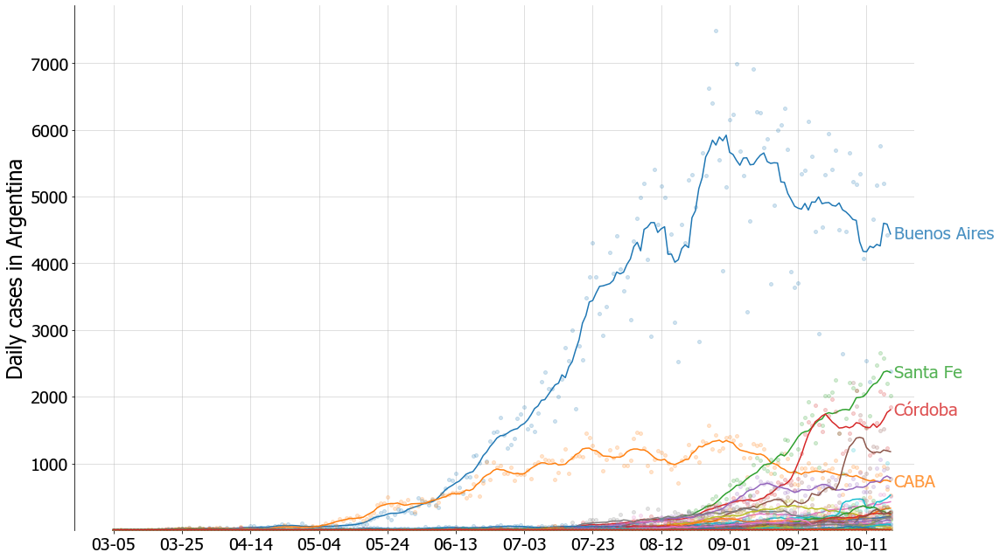

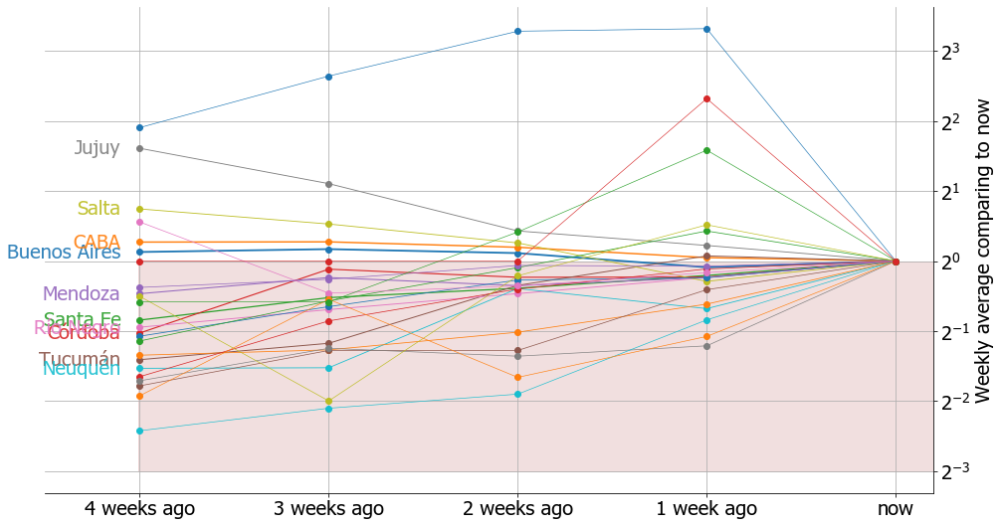

In [123]:
df = get_Argentina()
country = 'Argentina'

# fireplot(df, country=country, split=0, labelsize=42)
# relative_fireplot(df, country=country)
lineplots_states(df, country=country, annots=4, cut_tail=0, log_scale=False, savefig=True)
convergent_plot(df, country, annots=10, show=True, bottom=1/8)

## Sweden - out of update

In [182]:
get_Code(get_Sweden)

def get_Sweden():
    df = pd.read_csv('https://raw.githubusercontent.com/shortlisted/covid-19-sweden/master/cases_by_date_and_region.csv')
    df.drop('Totalt_antal_fall', axis=1, inplace=True)
    df.set_index('Statistikdatum', inplace=True)
    df = df[df.sum().sort_values(ascending=False).index]
    df.index = pd.to_datetime(df.index)
    df.index.rename('Sweden', inplace=True)
    print('Sweden cases by state fetched for %s'%df.index[-1].strftime('%Y-%m-%d'))
    return df



Sweden cases by state fetched for 2020-12-02


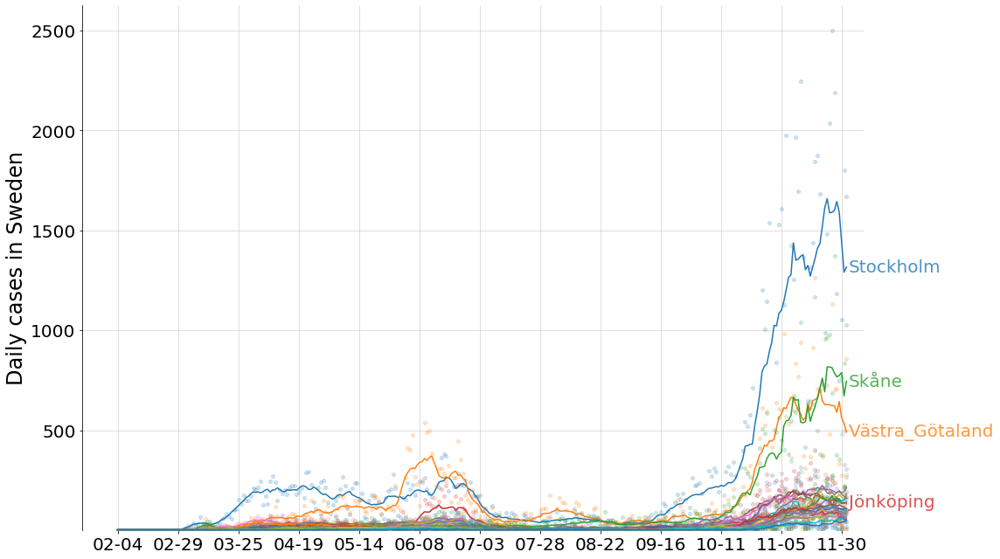

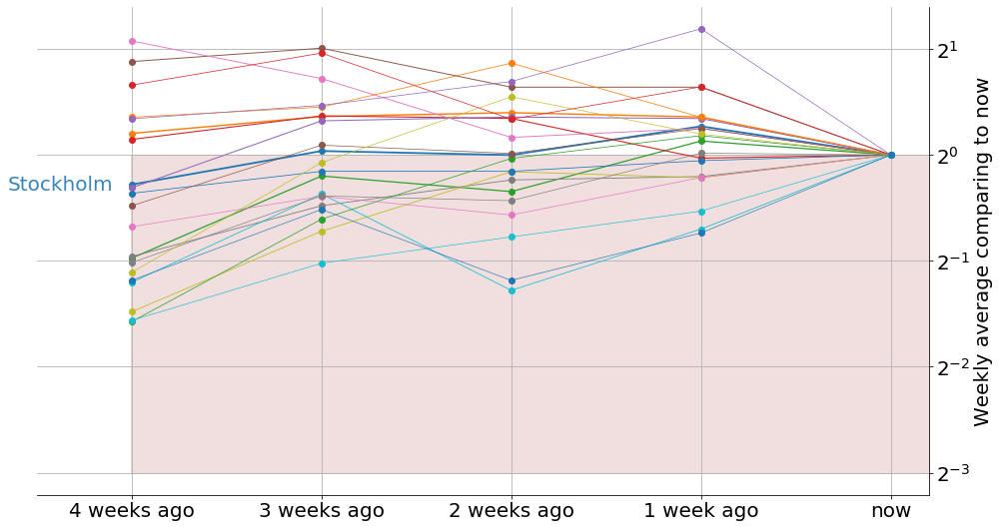

In [20]:
df = get_Sweden()
country = 'Sweden'
# df = df[:-2]

# fireplot(df, country=country, split=0, labelsize=42)
# relative_fireplot(df, country=country)
lineplots_states(df, country=country, annots=4, cut_tail=0, log_scale=False, savefig=True)
convergent_plot(df, country, annots=1, show=True, bottom=1/8)

## Ukraine - local

In [21]:
# https://github.com/dmytro-derkach/covid-19-ukraine
import glob
files = glob.glob('data/Country detailed/Ukraine/covid-19-ukraine-master/daily_reports/*.csv')
data = pd.DataFrame()
for file in files:
    temp = pd.read_csv(file)
    temp['date'] = file.split('\\')[1][:10]
    data = data.append(temp)
    
df = data.pivot_table(index='date', columns='Province_State', values='Confirmed')
df = df.diff().fillna(0).astype(int)
df = df[df.sum().sort_values(ascending=False).index]
df.index = pd.to_datetime(df.index)

In [22]:
df.T.sort_values(df.index[-1])

date,2020-03-03,2020-03-04,2020-03-05,2020-03-06,2020-03-07,2020-03-08,2020-03-09,2020-03-10,2020-03-11,2020-03-12,...,2020-12-20,2020-12-21,2020-12-22,2020-12-23,2020-12-24,2020-12-25,2020-12-26,2020-12-27,2020-12-28,2020-12-29
Province_State,,,,,,,,,,,,,,,,,,,,,
Zhytomyrskа,0,0,0,0,0,0,0,0,0,0,...,340,373,36,165,493,380,371,275,51,9
Kirovohradska,0,0,0,0,0,0,0,0,0,0,...,78,32,44,88,141,59,56,20,9,14
Luhanska,0,0,0,0,0,0,0,0,0,0,...,119,141,94,187,262,282,181,76,31,41
Sumska,0,0,0,0,0,0,0,0,0,0,...,382,176,151,180,422,567,358,199,82,41
Ivano-Frankivska,0,0,0,0,0,0,0,0,0,0,...,140,88,64,210,182,129,114,103,66,55
Khmelnytska,0,0,0,0,0,0,0,0,0,0,...,395,59,26,302,458,404,329,45,30,63
Vinnytsia,0,0,0,0,0,0,0,0,0,0,...,175,79,110,114,231,208,160,102,48,70
Ternopilska,0,0,0,0,0,0,0,0,0,0,...,157,106,81,159,234,203,153,124,88,82
Volynska,0,0,0,0,0,0,0,0,0,0,...,260,316,365,352,427,232,151,129,108,89


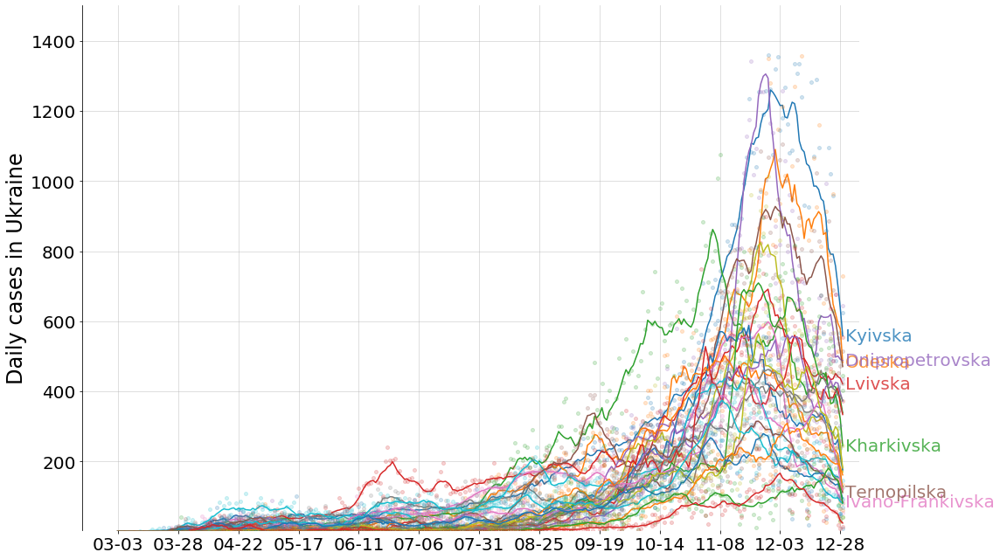

In [23]:
country = 'Ukraine'

# fireplot(df, country=country, split=0, labelsize=42)
# relative_fireplot(df, country=country)
lineplots_states(df, country=country, annots=[0,1,2,3,4,'Kharkivska','Ivano-Frankivska','Odeska','Ternopilska'], cut_tail=0, log_scale=False, savefig=True, roof=1500, bottom=5)
# convergent_plot(df, country, annots=4, show=True, bottom=1/8)

## Saudi Arabia -bug

In [59]:
raw = pd.read_json('https://raw.githubusercontent.com/aameen951/ksa_covid19/master/output/ksa_data_v2.json')
df = pd.DataFrame()

for i in range(len(raw)):
    city = raw['cities'].iloc[i]['name_eng']
    temp = pd.DataFrame(raw['cities'].loc[city]['records']).set_index(0)[1]
    temp.index = pd.to_datetime(temp.index, unit='ms')
#     df[city] = temp
    
# df = df.fillna(0).astype(int)
# df = df[df.sum().sort_values(ascending=False).index]
# df.index = pd.to_datetime(df.index.strftime('%Y-%m-%d'))

In [61]:
raw = pd.read_json('https://raw.githubusercontent.com/aameen951/ksa_covid19/master/output/ksa_data_v2.json')
df = pd.DataFrame()

for i in range(len(raw)):
    if i not in [24, 95,149,254]:
# for i in range(24):
        city = raw['cities'].iloc[i]['name_eng']
        temp = pd.DataFrame(raw['cities'].loc[city]['records']).set_index(0)[1]
        temp.index = pd.to_datetime(temp.index, unit='ms').strftime('%Y-%m-%d')
        df[city] = temp
    
# df = df.fillna(0).astype(int)
# df = df[df.sum().sort_values(ascending=False).index]
# df.index = pd.to_datetime(df.index.strftime('%Y-%m-%d'))

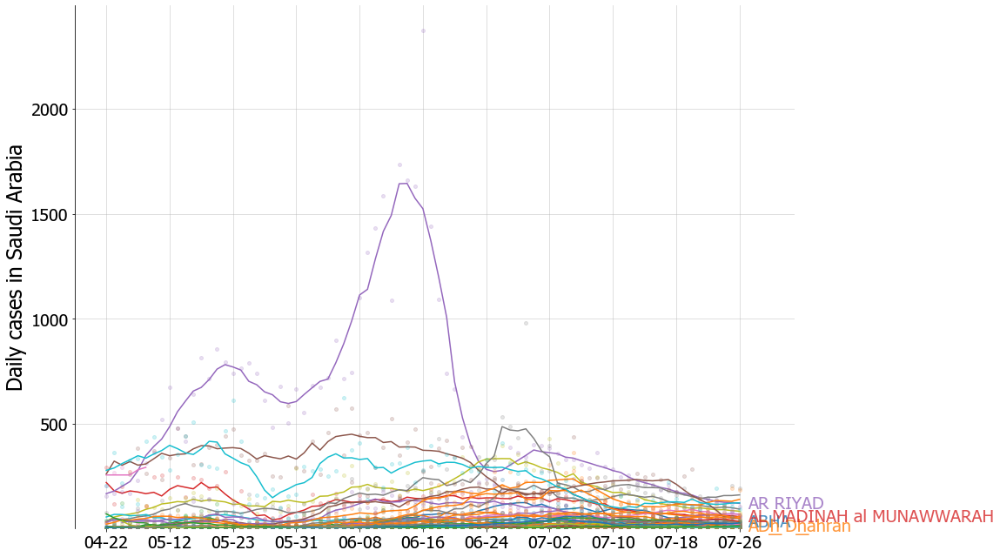

In [286]:
country = 'Saudi Arabia'

# fireplot(df, country=country, split=0, labelsize=36)
# relative_fireplot(df, country=country)
lineplots_states(df, country=country, annots=5, cut_tail=0, log_scale=False, savefig=True, bottom=5)
# convergent_plot(df, country, annots=4, show=True, bottom=1/12)

In [110]:
# MOH data https://covid19.moh.gov.sa/
from pandas.io.json import json_normalize
import json

with open('data/Country detailed/Saudi Arabia by Date.json') as data_file:    
    d= json.load(data_file)  

## Indonesia out of date

Indonesia cases by state fetched for 2020-11-10


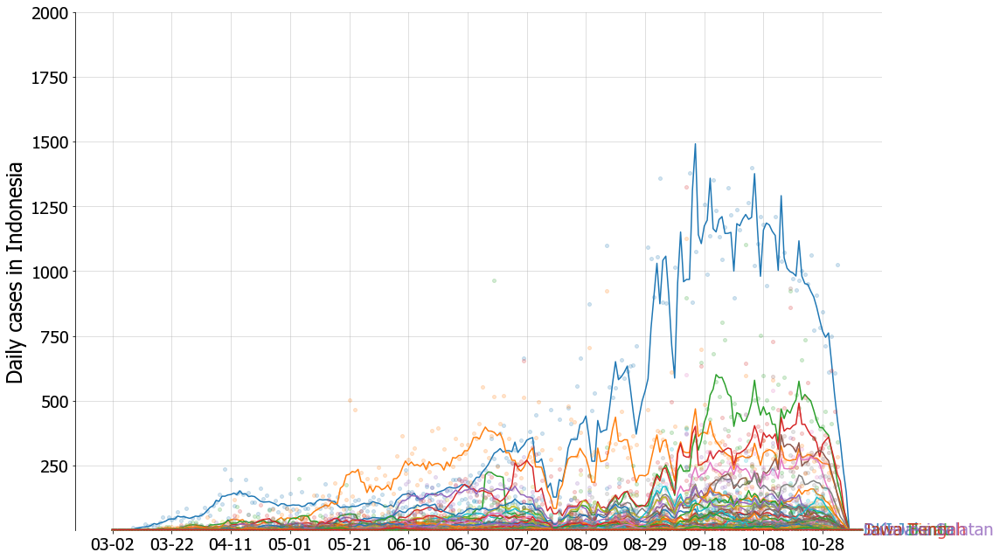

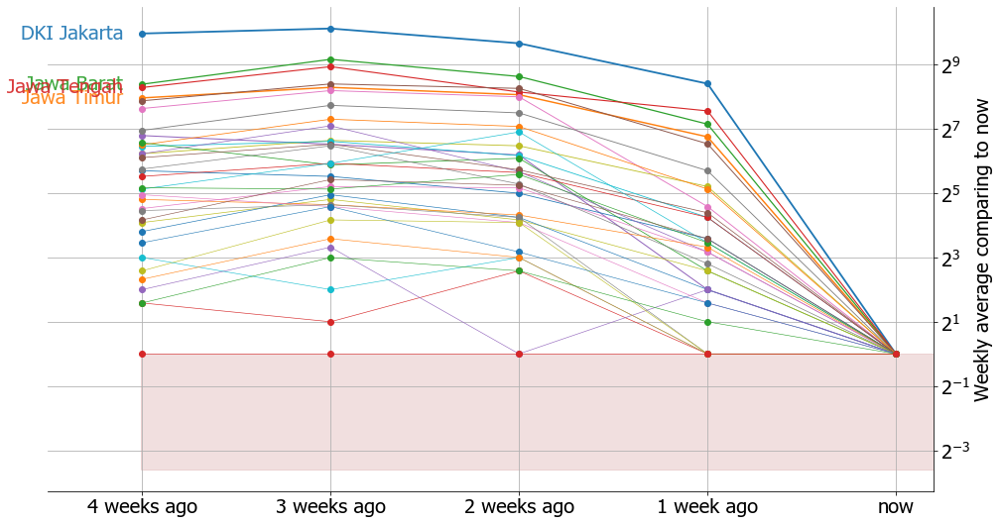

In [248]:
df = get_Indonesia()
country = 'Indonesia'
# df = df[:-2]

# fireplot(df, country=country, split=0, labelsize=36)
# relative_fireplot(df, country=country)
lineplots_states(df, country=country, annots=5, cut_tail=0, log_scale=False, savefig=True, roof=2000)
convergent_plot(df, country, annots=4, show=True, bottom=1/12)

## Colombia (no good)

In [34]:
df = get_Colombia()
country = 'Colombia'
df = df[:-1]

# fireplot(df, country=country, split=0, labelsize=36)
# relative_fireplot(df, country=country)
lineplots_states(df, country=country, annots=5, cut_tail=0, log_scale=False, savefig=True)
# convergent_plot(df, country, annots=4, show=True, bottom=1/12)

D:\Anaconda\lib\site-packages\IPython\core\interactiveshell.py:3254: DtypeWarning: Columns (14) have mixed types.Specify dtype option on import or set low_memory=False.
  if (await self.run_code(code, result,  async_=asy)):


KeyError: 'Departamento o Distrito '

## Ireland

Ireland cases by state fetched for 2020-12-27


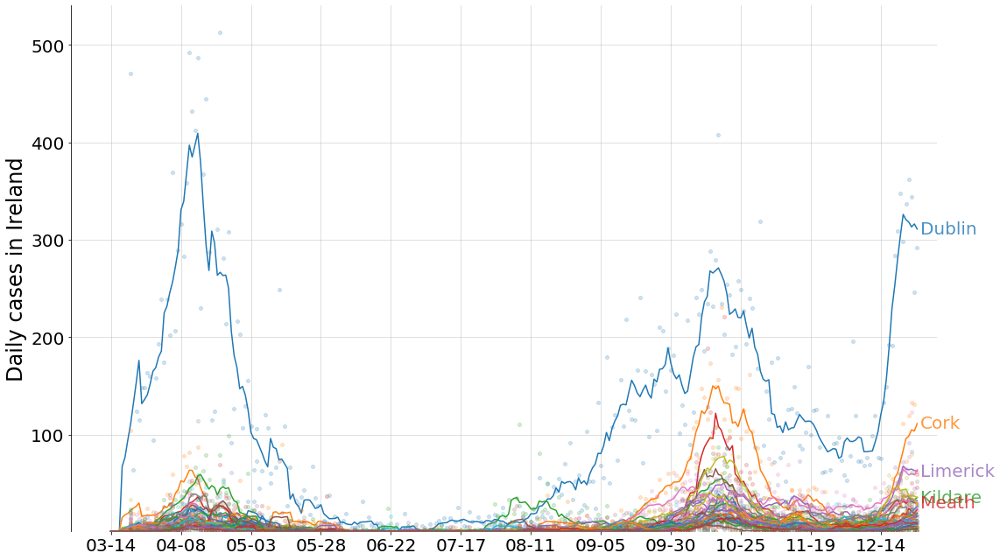

In [24]:
df = get_Ireland()
country = 'Ireland'
df = df[14:]

# fireplot(df, country=country, split=0, labelsize=48)
# fireplot(df.rolling(window=7, min_periods=1).mean().round(0).astype(int), country='Ireland_averaged', split=0, labelsize=36)
# relative_fireplot(df, country=country)
lineplots_states(df, country=country, annots=5, cut_tail=0, log_scale=False, savefig=True)
# convergent_plot(df, country, annots=4, show=True, bottom=1/12)

## Israel (no good)

In [460]:
df = pd.read_excel('data/country detailed/geographic-summary-per-day-2020-06-28.xlsx', sheet_name='Sheet1')

In [100]:
df = pd.read_excel('data/country detailed/Israel/geographic-summary-per-day-2020-07-29.xlsx', sheet_name='Data')

town,אבו גוש,אבו סנאן,אבטין,אבן יהודה,אום אל-פחם,אום בטין,אופקים,אור יהודה,אור עקיבא,אורנית,...,שמשית,שעב,שערי תקווה,שפרעם,שתולים,תל אביב-יפו,תל מונד,תל שבע,תפרח,תקוע
date,,,,,,,,,,,,,,,,,,,,,
2020/03/11,15.0,NaN,NaN,15.0,15.0,NaN,15.000000,15.0,15.000000,15.0,...,15.0,NaN,15.0,15.0,15.0,15.000000,15.0,NaN,NaN,15.0
2020/03/12,15.0,15.0,NaN,15.0,15.0,NaN,15.000000,15.0,15.000000,15.0,...,15.0,NaN,15.0,15.0,15.0,15.000000,15.0,NaN,NaN,15.0
2020/03/13,15.0,15.0,NaN,15.0,15.0,NaN,15.000000,15.0,15.000000,15.0,...,15.0,NaN,15.0,15.0,15.0,15.000000,15.0,NaN,NaN,15.0
2020/03/14,15.0,15.0,NaN,15.0,15.0,NaN,15.000000,15.0,15.000000,15.0,...,15.0,NaN,15.0,15.0,15.0,15.011905,15.0,NaN,NaN,15.0
2020/03/15,15.0,15.0,NaN,15.0,15.0,NaN,15.000000,15.0,15.000000,15.0,...,15.0,NaN,15.0,15.0,15.0,15.031915,15.0,NaN,NaN,15.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020/07/22,16.0,15.0,15.0,57.0,212.0,15.0,27.571429,40.7,23.833333,18.0,...,15.0,15.0,20.0,50.0,15.0,25.178571,24.0,24.0,28.0,15.0
2020/07/23,18.0,15.0,15.0,57.0,216.0,15.0,28.000000,42.5,24.333333,18.0,...,15.0,15.0,21.0,52.0,15.0,25.741071,24.0,24.0,28.0,15.0
2020/07/24,19.0,15.0,15.0,57.0,222.0,15.0,28.285714,43.0,24.666667,18.0,...,15.0,15.0,25.0,53.0,15.0,26.080357,25.0,24.0,28.0,15.0


In [119]:
t = df[['date','accumulated_cases','town']]
# t = t.replace('<15', 15).pivot_table(index='date', columns='town', values='accumulated_cases').diff().fillna(0).astype(int)
# t

In [479]:
df = df.drop(df[df['accumulated_cases'] == '<15'].index)

In [469]:
df.replace('<15', 10.0).pivot_table(index='date', columns='town', values='accumulated_cases').diff().fillna(0).astype(int)

town,אבו גוש,אבו סנאן,אבן יהודה,אום אל-פחם,אופקים,אור יהודה,אור עקיבא,אורנית,אזור,אחוזת ברק,...,שמשית,שעב,שערי תקווה,שפרעם,שתולים,תל אביב-יפו,תל מונד,תל שבע,תפרח,תקוע
date,,,,,,,,,,,,,,,,,,,,,
2020-03-11,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2020-03-12,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2020-03-13,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
2020-03-14,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2020-03-15,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-06-24,0,0,0,4,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2020-06-25,0,0,3,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2020-06-26,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [483]:
df.accumulated_cases = df.accumulated_cases.astype(int)

In [484]:
df = df.pivot_table(index='date', columns='town', values='accumulated_cases').diff().fillna(0).astype(int)
# df = df.replace('<15', 10.0).pivot_table(index='date', columns='town', values='accumulated_cases').diff().fillna(0).astype(int)
df.index = pd.to_datetime(df.index)
df = df[df.sum().sort_values(ascending=False).index].diff().fillna(0).astype(int)
df.index.rename('Israel', inplace=True)

Israel fireplot generated 06-28
Israel relative fireplot generated 06-28


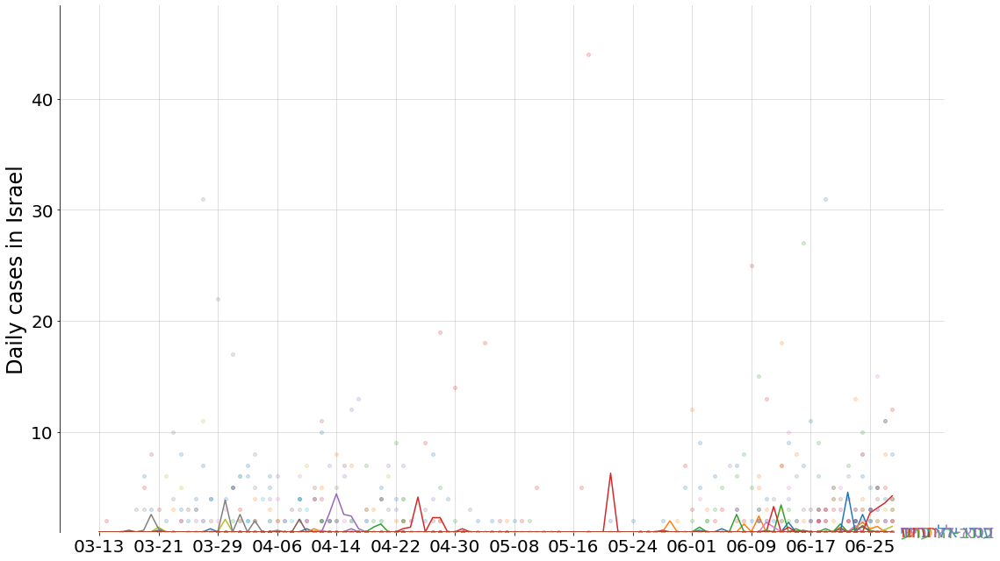

In [485]:
country = 'Israel'

fireplot(df, country=country, split=0, labelsize=36)
relative_fireplot(df, country=country)
lineplots_states(df, country=country, annots=5, cut_tail=0, log_scale=False, savefig=True)
# convergent_plot(df, country, annots=4, show=True, bottom=1/12)

### From Amir

In [204]:
df = pd.read_csv('data/Country detailed/Israel/ISRL.csv')
df = df.pivot_table(index='dates', columns='City', values='The number of verified patients added in the last 3 days').fillna(0).astype(int)
# .set_index('dates')
df.index = pd.to_datetime(df.index)
df = df[df.sum().sort_values(ascending=False).index]

# df = df.iloc[:,:30]

In [208]:
df.sum().sum()

31525

In [199]:
df = pd.read_csv('data/Country detailed/Israel/output3.csv').set_index('dates').diff().fillna(0).astype(int)
df.index = pd.to_datetime(df.index)
df = df[df.sum().sort_values(ascending=False).index]
df
# df = df.iloc[:,50:100]

,ירושלים,תל אביב - יפו,בני ברק,אשדוד,בת ים,פתח תקווה,ראשון לציון,חולון,ביתר עילית,באר שבע,...,סייד (שבט),נוקדים,מסעדה,נופית,נווה דניאל,נאעורה,משהד,בסמת טבעון,ברכה,אבו ג'ווייעד (שבט)
dates,,,,,,,,,,,,,,,,,,,,,
2020-05-04,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2020-05-05,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2020-05-06,15,0,10,1,0,2,0,3,0,6,...,0,0,0,0,0,0,0,0,0,0
2020-05-07,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2020-05-08,33,7,22,0,1,3,0,0,7,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-07-05,630,300,281,230,108,94,86,87,91,55,...,0,0,0,0,0,0,0,0,0,0
2020-07-06,85,102,33,28,8,26,20,19,15,11,...,0,0,0,0,0,0,0,0,0,0
2020-07-07,169,94,97,48,18,24,21,13,35,12,...,0,0,0,0,0,0,0,0,0,0


In [192]:
df.sum(axis=1)

dates
2020-05-04       0
2020-05-05       1
2020-05-06      91
2020-05-07       0
2020-05-08     120
              ... 
2020-07-05    3603
2020-07-06     739
2020-07-07     980
2020-07-08    1440
2020-07-09    1193
Length: 67, dtype: int64

In [197]:
# k=pd.DataFrame({'1':df.sum(axis=1)})
# k['2'] = df.sum(axis=1)
k.tail(30)

,1,2
dates,,
2020-06-10,3,NaN
2020-06-11,513,459.0
2020-06-12,4,NaN
2020-06-13,365,447.0
2020-06-14,2,NaN
2020-06-15,271,363.0
2020-06-16,240,462.0
2020-06-17,253,599.0
2020-06-18,0,NaN


Israel_3 fireplot generated 08-02
Israel_3 relative fireplot generated 08-02


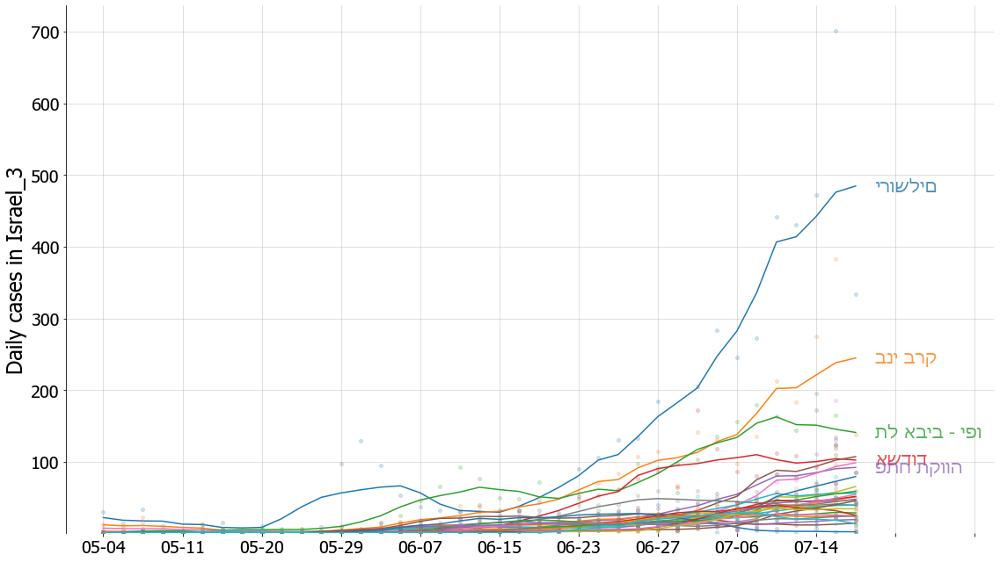

In [186]:
country = 'Israel_3'

fireplot(df, country=country, split=0, labelsize=36)
relative_fireplot(df, country=country)
lineplots_states(df, country=country, annots=5, cut_tail=0, log_scale=False, savefig=True)

In [209]:
df = pd.read_csv('data/Country detailed/Israel/a.csv')
df

,OBJECTID,Place,תאריך,שעות שהייה,x,y
0,1938851,סופר-פארם אור יהודה - אור יהודה,19/7/2020,מ 2020-07-19 10:00 עד 2020-07-19 11:30,34.870563,32.024464
1,1938852,רמי לוי חדרה - חדרה,19/7/2020,מ 2020-07-19 07:00 עד 2020-07-19 13:30,34.905127,32.455490
2,1938853,מלון הים האדום - אילת,19/7/2020,מ 2020-07-19 08:00 עד 2020-07-19 23:30,34.952657,29.554979
3,1938854,Adika - קרית עקרון,19/7/2020,מ 2020-07-19 16:30 עד 2020-07-19 17:30,34.818353,31.863533
4,1938855,"המפלים הלבנים - עין הנצי""ב",19/7/2020,מ 2020-07-19 12:30 עד 2020-07-19 18:00,35.503840,32.475570
...,...,...,...,...,...,...
1995,1940846,בית המדרש יביע אומר - בני ברק,26/7/2020,מ 2020-07-27 05:00 עד 2020-07-27 07:30,34.839884,32.073096
1996,1940847,"הרב מיימון 30, בני ברק",24/7/2020,מ 2020-07-24 08:30 עד 2020-07-24 09:30,34.831255,32.088003
1997,1940848,"הרב מיימון 30, בני ברק",25/7/2020,מ 2020-07-25 08:30 עד 2020-07-25 11:00,34.831255,32.088003
1998,1940849,פינת הגלידה - אלעד,23/7/2020,מ 2020-07-23 21:30 עד 2020-07-23 22:00,34.962199,32.052628


## Japan

Japan cases by state fetched for 2020-12-30


findfont: Font family ['sans-serif'] not found. Falling back to DejaVu Sans.
findfont: Font family ['sans-serif'] not found. Falling back to DejaVu Sans.
C:\Users\dav08\Anaconda3\lib\site-packages\matplotlib\backends\backend_agg.py:211: RuntimeWarning: Glyph 26481 missing from current font.
  font.set_text(s, 0.0, flags=flags)
C:\Users\dav08\Anaconda3\lib\site-packages\matplotlib\backends\backend_agg.py:211: RuntimeWarning: Glyph 20140 missing from current font.
  font.set_text(s, 0.0, flags=flags)
C:\Users\dav08\Anaconda3\lib\site-packages\matplotlib\backends\backend_agg.py:211: RuntimeWarning: Glyph 22823 missing from current font.
  font.set_text(s, 0.0, flags=flags)
C:\Users\dav08\Anaconda3\lib\site-packages\matplotlib\backends\backend_agg.py:211: RuntimeWarning: Glyph 38442 missing from current font.
  font.set_text(s, 0.0, flags=flags)
C:\Users\dav08\Anaconda3\lib\site-packages\matplotlib\backends\backend_agg.py:211: RuntimeWarning: Glyph 31070 missing from current font.
  font.s

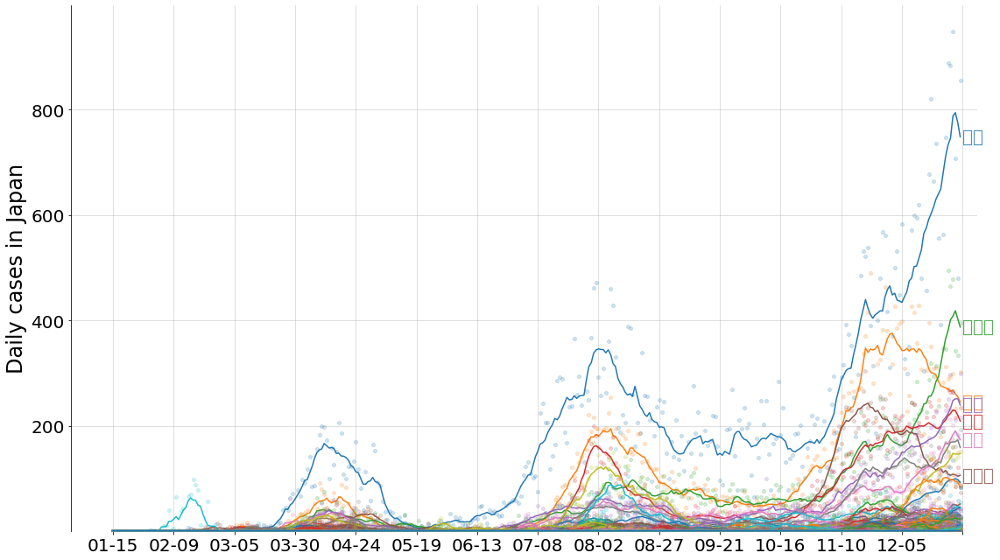

In [25]:
# need to download font
df = get_Japan()

country = 'Japan'
df = df[:-1]

plt.rcParams['font.family'] = ['sans-serif']
plt.rcParams['font.sans-serif'] = ['SimHei']

# fireplot(df, country=country, split=0, labelsize=36, dpi=50)
# relative_fireplot(df, country=country)
lineplots_states(df, country=country, annots=7, cut_tail=0, log_scale=False, savefig=True)
# convergent_plot(df, country, annots=4, show=True, bottom=1/12) 

In [27]:
# run this to reset fonts
plt.rcParams['font.family'] = ['sans-serif']
plt.rcParams['font.sans-serif'] = ['Tahoma']

## Australia

Australia cases by state fetched for 2020-12-29


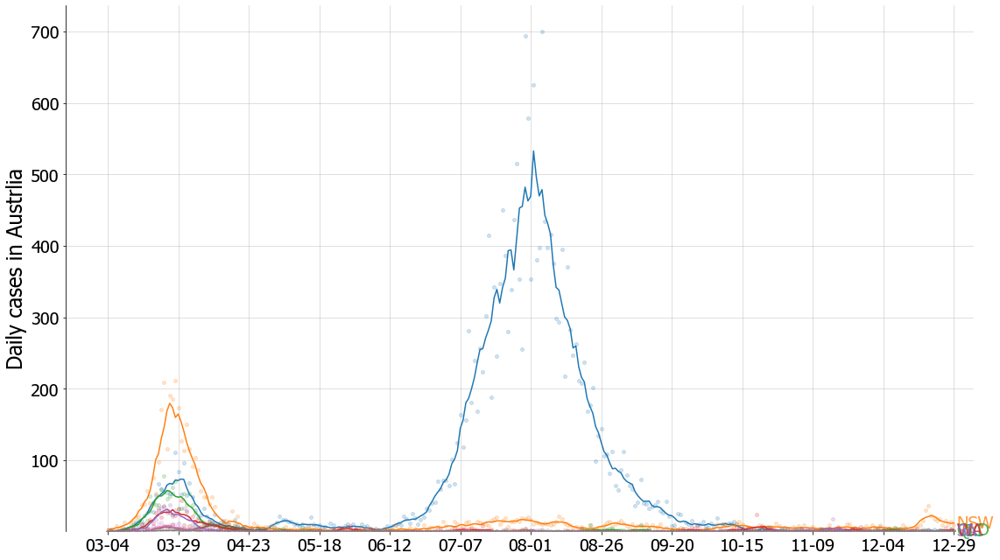

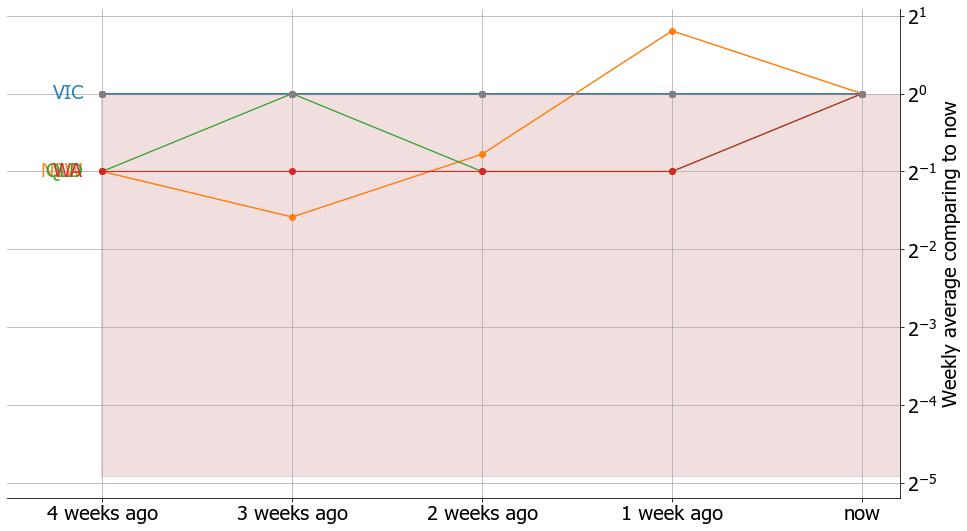

In [28]:
df = get_Australia()
country = 'Austrlia'

# fireplot(df, country=country, split=0, labelsize=36)
# relative_fireplot(df, country=country)
lineplots_states(df, country=country, annots=5, cut_tail=0, log_scale=False, savefig=True)
convergent_plot(df, country, annots=4, show=True, bottom=1/30)

## Pakistan

Pakistan cases by state fetched for 2020-12-28


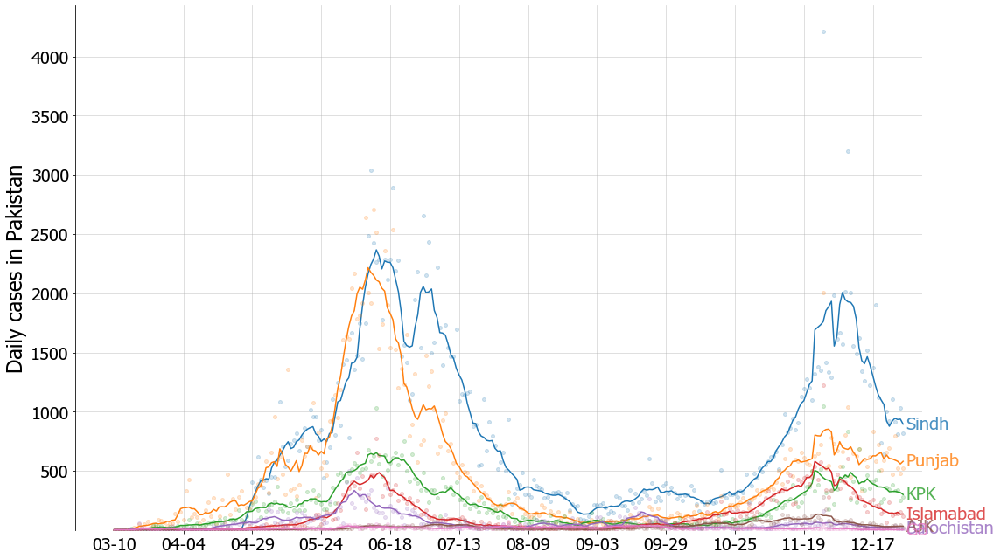

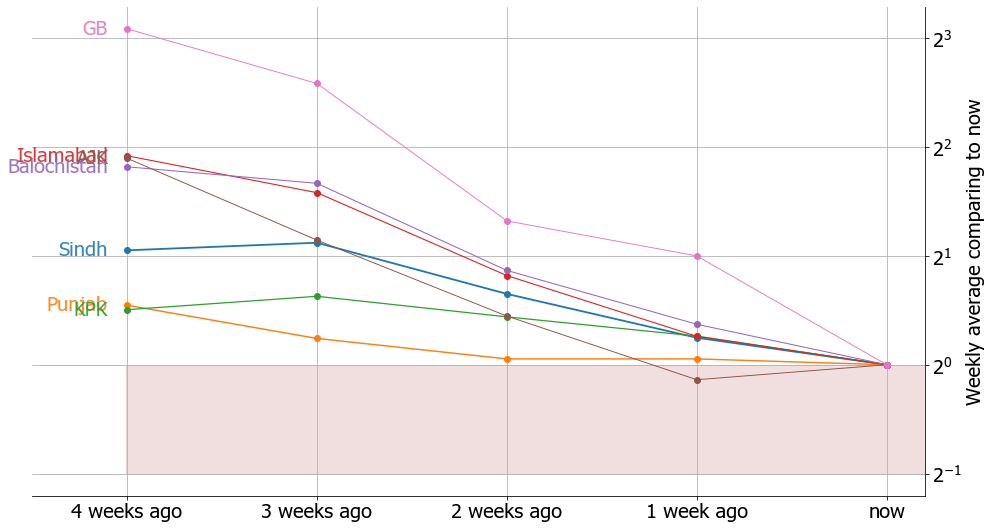

In [29]:
df = get_Pakistan()
country = 'Pakistan'

# fireplot(df, country=country, split=0, labelsize=36)
# relative_fireplot(df, country=country)
lineplots_states(df, country=country, annots=7, cut_tail=0, log_scale=False, savefig=True)
convergent_plot(df, country, annots=7, show=True, bottom=1/2)

## Philippines

In [119]:
# deprecated,
def get_Philippines():
    df = pd.read_csv('https://raw.githubusercontent.com/donfiguerres/COVID-19-Tracker-PH/master/testdata/07%20Testing%20Aggregates.csv')
    df = df.pivot_table(index='report_date',columns='facility_name', values='cumulative_positive_individuals').diff().fillna(0).astype(int)
    df = df[df.sum().sort_values(ascending=False).index]
    df.index = pd.to_datetime(df.index)
    df.index.rename('Philippines', inplace=True)
    print('Philippines cases by state fetched for %s'%df.index[-1].strftime('%Y-%m-%d'))    
    return df   

df = get_Philippines()
country = 'Philippines'

fireplot(df, country=country, split=0, labelsize=36, dpi=15)
# relative_fireplot(df, country=country)
lineplots_states(df, country=country, annots=5, cut_tail=0, log_scale=False, savefig=True)
convergent_plot(df, country, annots=4, show=True, bottom=1/30)

In [256]:
# Philippines DOH data at https://drive.google.com/drive/folders/1IQEg6BJ2zd_VK8JmTGzhVtzEQ3VIBY2E
df = pd.read_csv('data/Country detailed/DOH COVID Data Drop_ 20201119 - 04 Case Information.csv')
df.head()

,CaseCode,Age,AgeGroup,Sex,DateSpecimen,DateResultRelease,DateRepConf,DateDied,DateRecover,RemovalType,...,ProvRes,CityMunRes,CityMuniPSGC,BarangayRes,BarangayPSGC,HealthStatus,Quarantined,DateOnset,Pregnanttab,ValidationStatus
0,C961991,38.0,35 to 39,FEMALE,2020-07-20,2020-07-24,2020-07-28,NaN,NaN,RECOVERED,...,NaN,NaN,NaN,NaN,NaN,RECOVERED,NO,NaN,NO,"Health Status is ""Recovered"", but no Date Reco..."
1,C374422,51.0,50 to 54,FEMALE,2020-05-25,NaN,2020-05-31,NaN,NaN,RECOVERED,...,NaN,NaN,NaN,NaN,NaN,RECOVERED,YES,NaN,NO,"Health Status is ""Recovered"", but no Date Reco..."
2,C927869,68.0,65 to 69,MALE,2020-07-27,2020-07-29,2020-08-01,NaN,NaN,RECOVERED,...,BATAAN,CITY OF BALANGA (CAPITAL),PH030803000,NaN,NaN,RECOVERED,NO,NaN,NaN,"Removal Type is ""Recovered"", but no Recovered ..."
3,C111115,55.0,55 to 59,MALE,2020-07-14,2020-07-16,2020-07-19,NaN,NaN,RECOVERED,...,NCR,NaN,NaN,NaN,NaN,RECOVERED,NO,NaN,NaN,"Health Status is ""Recovered"", but no Date Reco..."
4,C711756,28.0,25 to 29,FEMALE,2020-06-17,NaN,2020-06-23,NaN,NaN,RECOVERED,...,NaN,NaN,NaN,NaN,NaN,RECOVERED,NO,NaN,NO,"Health Status is ""Recovered"", but no Date Reco..."


In [257]:
focus = df[['CaseCode','DateRepConf','RegionRes']].copy()
focus = focus.groupby(['DateRepConf','RegionRes']).agg('count').unstack()
focus = focus.fillna(0).astype(int)
focus.columns = focus.columns.droplevel(0)
focus = focus[focus.sum().sort_values(ascending=False).index]
focus.index = pd.to_datetime(focus.index)
ph_region_name = {'NCR':'Luzon-Capital Region',
                 'Region IV-A: CALABARZON':'Luzon-Calabarzon',
                 'Region III: Central Luzon':'Luzon-Central Luzon',
                 'Region VII: Central Visayas':'Visayas-Central Visayas',
                  'Region VI: Western Visayas':'Visayas-Western Visayas',
                  'ROF':'Returning Overseas Filipinos',
                  'Region VIII: Eastern Visayas':'Visayas-Eastern Visayas',
                  'Region XI: Davao Region':'Mindanao-Davao',
                  'Region X: Northern Mindanao':'Mindanao-Northern Mindanao',
                  'CAR':'Luzon-Cordillera',
                  'Region IX: Zamboanga Peninsula':'Mindano-Zamboanga',
                  'Region XII: SOCCSKSARGEN':'Mindanao-Soccsksargen',
                  'Region V: Bicol Region':'Luzon-Bicol',
                  'Region I: Ilocos Region':'Luzon-Ilocos',
                  'Region II: Cagayan Valley':'Luzon-Cagayan Valley',
                  'CARAGA':'Mindanao-Caraga',
                  'Region IV-B: MIMAROPA':'Luzon-Mimaropa',
                  'BARMM':'Midanao-Bangsamoro'
                 }

focus.rename(columns = ph_region_name, inplace=True)

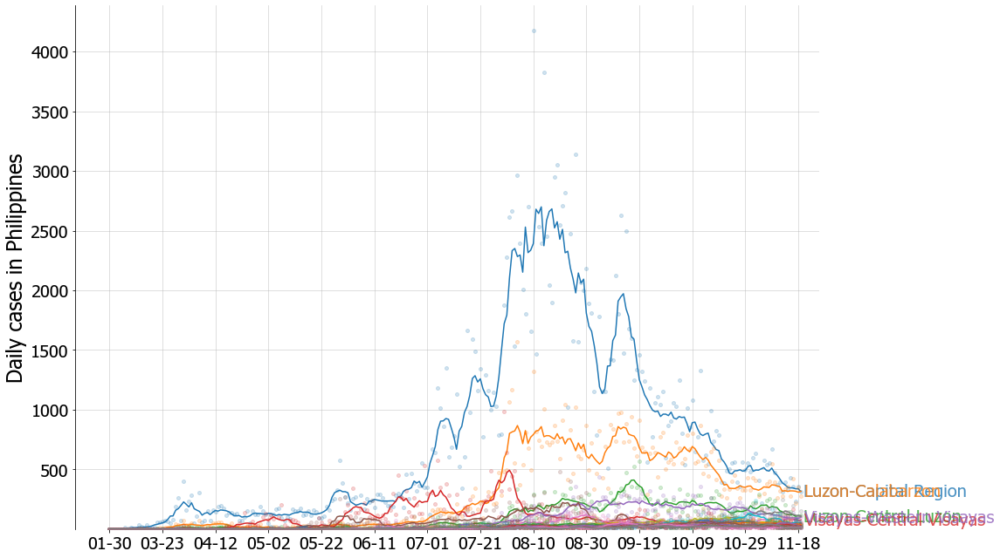

In [259]:
country = 'Philippines'

# fireplot(focus, country=country, split=0, labelsize=36, dpi=28)
# relative_fireplot(df, country=country)
lineplots_states(focus, country=country, annots=5, cut_tail=0, log_scale=False, savefig=True)
# convergent_plot(focus, country, annots=4, show=True, bottom=1/30)

## South Korea

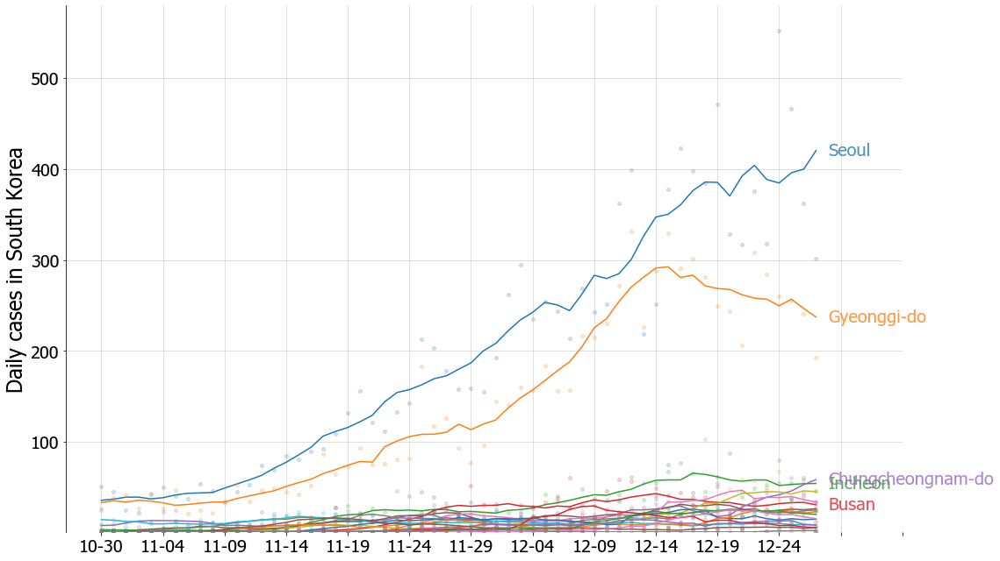

In [30]:
df = pd.read_csv('https://raw.githubusercontent.com/staedi/nCOV-summary/master/time_series_covid19.csv')

focus = df[df['Country/Region']== 'Korea, South'].set_index('Date')
focus = focus[['Province/State','i_Confirmed']]
focus.index = pd.to_datetime(focus.index)
focus = focus.pivot_table(index=focus.index,columns='Province/State', values='i_Confirmed')
focus = focus[focus.sum().sort_values(ascending=False).index]
focus = focus.iloc[:-1] 

country = 'South Korea'

# fireplot(df, country=country, split=0, labelsize=36)
# relative_fireplot(df, country=country)
lineplots_states(focus, country=country, annots=5, cut_tail=0, log_scale=False, savefig=True)
# convergent_plot(focus, country, annots=4, show=True, bottom=1/30)

In [184]:
# def get_SouthKorea():
#     df = pd.read_csv('https://raw.githubusercontent.com/jooeungen/coronaboard_kr/ac47f38811602283cf229de3b09a1640b1aefcc2/kr_regional_daily.csv')
#     df = df.pivot_table(index='date',columns='region', values='confirmed').diff().fillna(0).astype(int)
#     df = df[df.sum().sort_values(ascending=False).index]
#     df.index = pd.to_datetime(df.index,format='%Y%m%d')
#     df.index.rename('SouthKorea', inplace=True)
#     print('SouthKorea cases by state fetched for %s'%df.index[-1].strftime('%Y-%m-%d'))
#     return df

# df = get_SouthKorea()
# country = 'South Korea'
# df = df[-90:]

# # plt.rcParams['font.sans-serif'] = ['Source Han Sans TW', 'sans-serif']
# # plt.rcParams['font.family'] = ['sans-serif']
# # plt.rcParams['font.sans-serif'] = ['SimHei']
# # plt.rcParams['font.sans-serif'] = ['Source Han Sans TW']
# # plt.rcParams["font.family"] = 'Nanum Brush Script OTF'
# plt.rcParams["font.family"] = 'Malgun Gothic'

# # fireplot(df, country=country, split=0, labelsize=36)
# # relative_fireplot(df, country=country)
# lineplots_states(df, country=country, annots=5, cut_tail=0, log_scale=False, savefig=True)
# convergent_plot(df, country, annots=4, show=True, bottom=1/30)

## Bangladesh - updating weekly

In [56]:
def get_Bangladesh():
    df = pd.read_csv('https://raw.githubusercontent.com/stevenliuyi/covid19/master/data/bangladesh-data/bangladesh.csv')
    df = df.pivot_table(index='data',columns='region',values='confirmed').diff().fillna(0).astype(int)
    df = df[df.sum().sort_values(ascending=False).index]
    df.index = pd.to_datetime(df.index)
    df.index.rename('Bangladesh', inplace=True)
    print('Bangladesh cases by state fetched for %s'%df.index[-1].strftime('%Y-%m-%d'))
    return df

df = get_Bangladesh()
country = 'Bangladesh'

# fireplot(df, country=country, split=0, labelsize=36)
# relative_fireplot(df, country=country)
lineplots_states(df, country=country, annots=5, cut_tail=0, log_scale=False, savefig=True)
convergent_plot(df, country, annots=4, show=True, bottom=1/30)

EmptyDataError: No columns to parse from file

Nigeria cases by state fetched for 2020-10-30


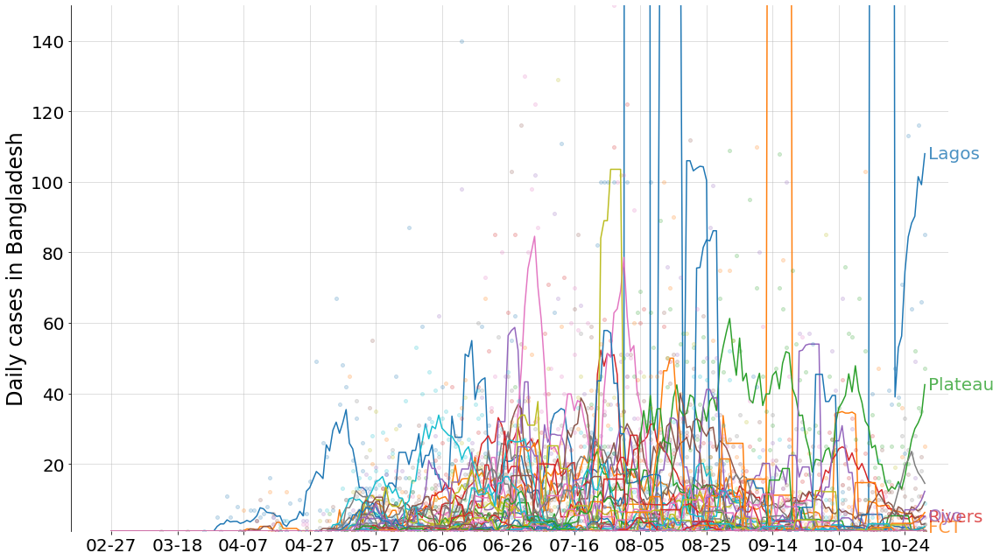

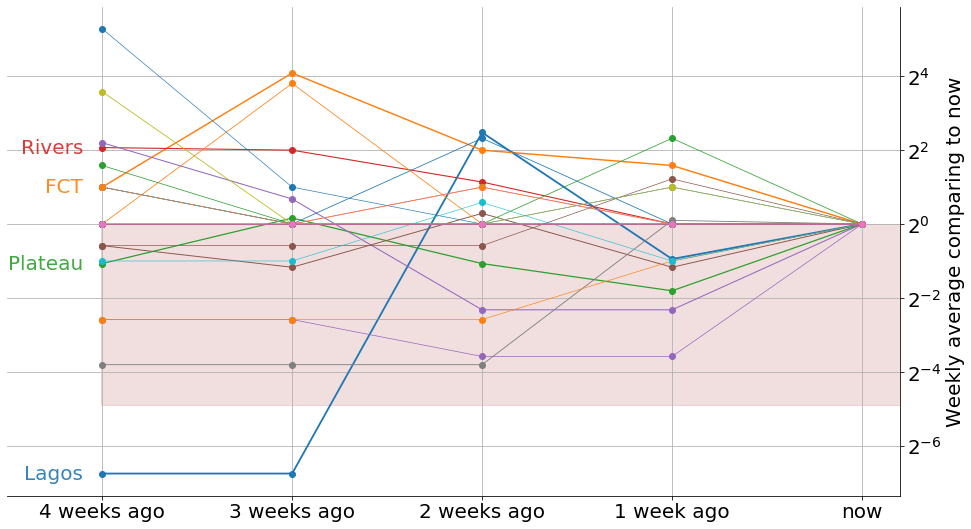

In [27]:
def get_Nigeria():
    df = pd.read_csv('https://raw.githubusercontent.com/Kamparia/nigeria-covid19-data/master/data/csv/ncdc-covid19-states-daily-recovered.csv')
    df = df.set_index('Date').diff().fillna(0).astype(int)
    df = df[df.sum().sort_values(ascending=False).index]
    df.index = pd.to_datetime(df.index)
    df.index.rename('Nigeria', inplace=True)
    print('Nigeria cases by state fetched for %s'%df.index[-1].strftime('%Y-%m-%d'))
    return(df)

df = get_Nigeria()
country = 'Bangladesh'

# fireplot(df, country=country, split=0, labelsize=36)
# relative_fireplot(df, country=country)
lineplots_states(df, country=country, annots=5, cut_tail=0, log_scale=False, savefig=True, roof=150)
convergent_plot(df, country, annots=4, show=True, bottom=1/30)

## Hungary

In [172]:
df.sum(axis=1)

Date
2020-08-09      43
2020-08-10      35
2020-08-11      15
2020-08-12      22
2020-08-13      45
              ... 
2020-12-02    4136
2020-12-03    6635
2020-12-04    6212
2020-12-05    5525
2020-12-06    6697
Length: 120, dtype: int64

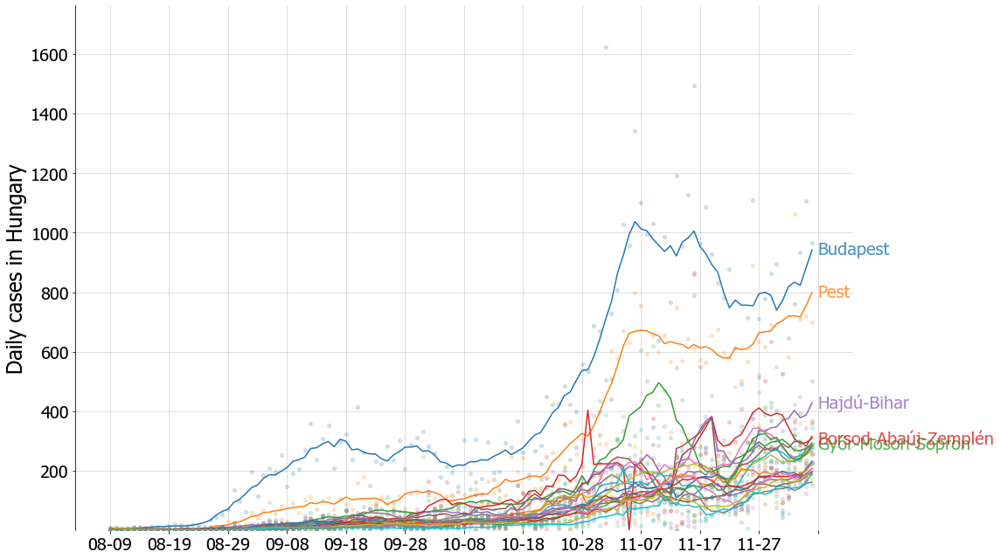

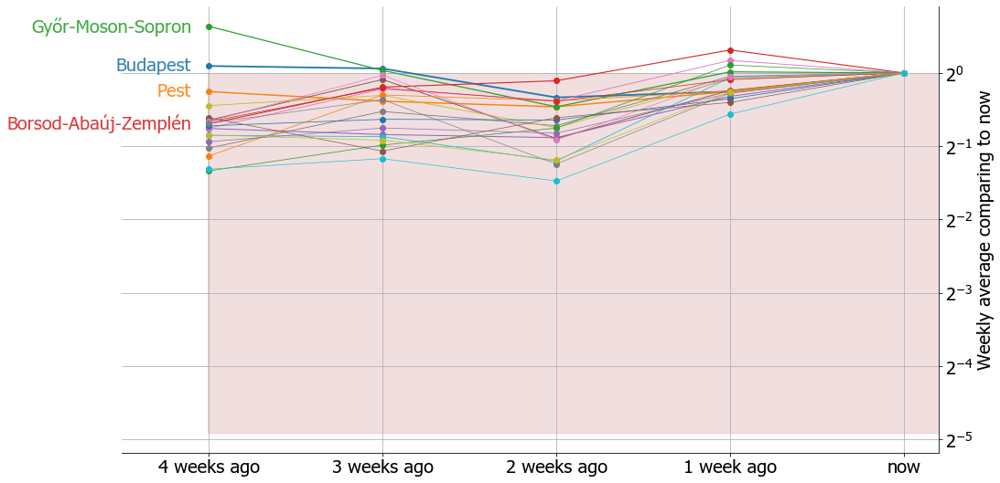

In [31]:
df = pd.read_csv('https://raw.githubusercontent.com/nickgon/Hungary-COVID19-Data/master/Hungary_COVID19_data_by_county.csv').drop(['Total infections','New cases'], axis=1)
df = df.set_index('Date') 
df.index = pd.to_datetime(df.index)
df = df.diff().fillna(0).astype(int)
df = df[df.sum().sort_values(ascending=False).index]
df = df[130:]

country = 'Hungary'

# fireplot(df, country=country, split=0, labelsize=36)
# relative_fireplot(df, country=country)
lineplots_states(df, country=country, annots=5, cut_tail=0, log_scale=False, savefig=True)
convergent_plot(df, country, annots=4, show=True, bottom=1/30)

## Netherlands

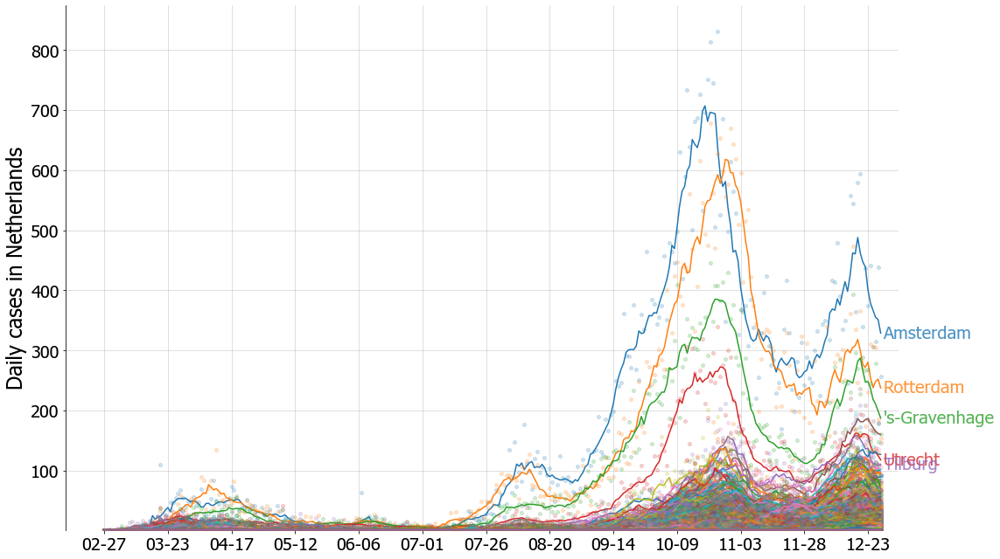

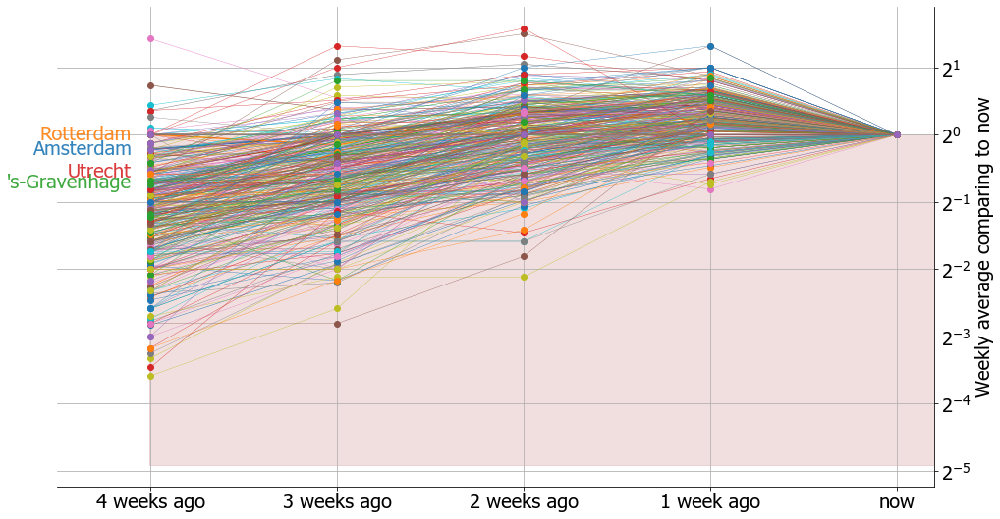

In [32]:
df = pd.read_csv('https://raw.githubusercontent.com/J535D165/CoronaWatchNL/master/data/rivm_NL_covid19_total_municipality.csv')
df = df.pivot_table(index='Datum', columns='Gemeentenaam', values='Aantal') # Provincienaam = provinces, Gemeentenaam = cities
df.index = pd.to_datetime(df.index)
df = df.diff().fillna(0).astype(int)
df = df[df.sum().sort_values(ascending=False).index]
df = df[:-1]

country = 'Netherlands'

# fireplot(df, country=country, split=0, labelsize=36)
# relative_fireplot(df, country=country)
lineplots_states(df, country=country, annots=5, cut_tail=0, log_scale=False, savefig=True)
convergent_plot(df, country, annots=4, show=True, bottom=1/30)

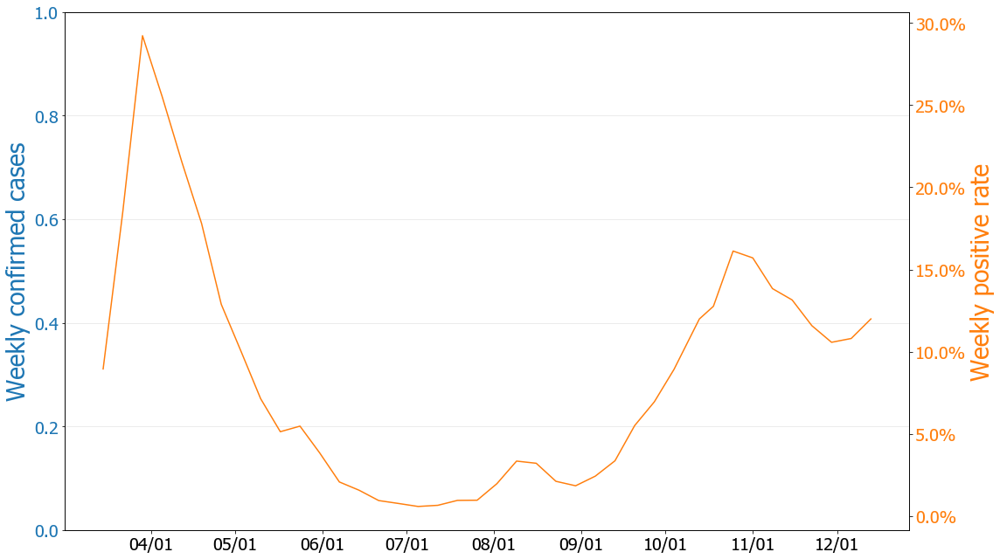

In [33]:
df = pd.read_csv('https://raw.githubusercontent.com/J535D165/CoronaWatchNL/master/data-misc/data-test/RIVM_NL_test_latest.csv').set_index('EindDatum')
df.index = pd.to_datetime(df.index)

fig, ax = plt.subplots(figsize=(16, 9))

t = df[df['Type']=='Totaal']
# ax.bar(t.index, height=t['Aantal'], width=6, label='Weekly tests')
k = df[df['Type']=='Positief']
# ax.bar(k.index, height=k['Aantal'], width=6, label='Weekly positive tests', alpha=0.6)

ax2 = ax.twinx()
ax2.plot(k['Aantal'] / t['Aantal'] * 100, c='C1')

ax.tick_params(labelsize=20)
ax.tick_params(axis='y', labelcolor='C0')
ax.xaxis.set_major_formatter(mdates.DateFormatter('%m/%d'))
ax.grid(axis='y', alpha=0.3)
ax.set_ylabel('Weekly confirmed cases', color='C0', fontsize=28)

ax2.tick_params(labelsize=20, labelcolor='C1')
ax2.set_ylabel('Weekly positive rate', color='C1', fontsize=28)
import matplotlib.ticker as mtick
ax2.yaxis.set_major_formatter(mtick.PercentFormatter())

plt.tight_layout()
# plt.savefig('figures/Daily_misc_12_16.png', dpi=100)

In [198]:
df = pd.read_csv('https://raw.githubusercontent.com/J535D165/CoronaWatchNL/master/data-desc/data-deceased/RIVM_NL_deceased_age_sex.csv')
# df.groupby(['Datum','LeeftijdGroep']).agg('sum')
df.pivot_table(index='Datum', columns='LeeftijdGroep', values='Aantal')

LeeftijdGroep,0-4,10-14,15-19,20-24,25-29,30-34,35-39,40-44,45-49,5-9,...,55-59,60-64,65-69,70-74,75-79,80-84,85-89,90-94,95+,Niet vermeld
Datum,,,,,,,,,,,,,,,,,,,,,
2020-04-07,0.0,0.0,0.0,0.0,0.5,0.5,0.5,1.0,3.0,0.0,...,15.5,31.0,67.0,111.5,208.5,247.5,223.0,101.5,30.0,1.0
2020-04-08,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,2.0,1.0,4.0,10.5,8.5,15.5,18.0,12.0,2.0,0.0
2020-04-09,0.0,0.0,0.0,0.0,0.5,0.0,0.5,0.0,0.5,0.0,...,0.0,2.5,6.0,8.5,12.5,17.0,15.5,9.5,1.0,NaN
2020-04-10,0.0,0.0,0.0,0.0,0.0,0.5,0.0,0.0,0.0,0.0,...,1.0,1.0,3.0,4.0,9.0,14.5,14.0,6.0,3.5,NaN
2020-04-11,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.0,1.0,4.0,5.5,13.5,10.5,15.5,11.5,3.5,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-08-25,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.5,1.0,0.0,0.5,2.5,3.5,2.5,4.0,1.5,NaN
2020-09-01,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,1.0,1.0,0.5,0.5,3.5,4.0,0.0,NaN
2020-09-08,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.5,0.5,1.0,-0.5,2.5,2.0,0.5,0.0,NaN


## Turkey

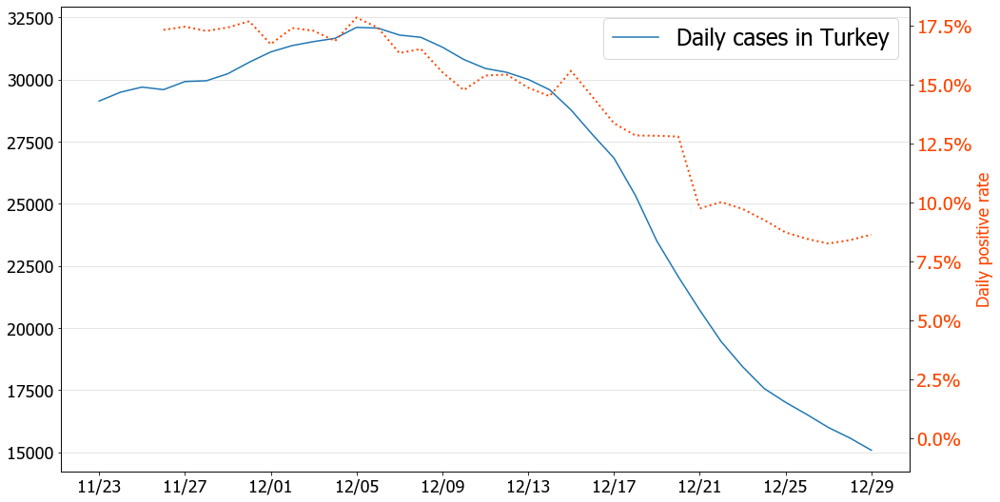

In [33]:
df = pd.read_csv('https://raw.githubusercontent.com/hbayindir/covid-19-turkey/master/dataset/timeline.csv').set_index('date')
df.index = pd.to_datetime(df.index, dayfirst=True)

fig, ax = plt.subplots(figsize=(16,9))

ax.plot(df['cases'].rolling(window=7, min_periods=1, center=True).mean(), label='Daily cases in Turkey')

ax2 = ax.twinx()
color = 'orangered'
ax2.set_ylabel('Daily positive rate', color=color, fontsize=18)
ax2.plot(df['cases'] / df['tests']*100, ls=':', lw=2, color=color)
ax2.tick_params(axis='y', labelcolor=color)
import matplotlib.ticker as mtick
ax2.yaxis.set_major_formatter(mtick.PercentFormatter())
ax2.tick_params(labelsize=20)

ax.grid(axis='y', alpha=0.4)
ax2.set_ylim(bottom=-1.4)
ax.legend(fontsize=24)
ax.tick_params(labelsize=18)
ax.xaxis.set_major_locator(plt.MaxNLocator(12))
ax.xaxis.set_major_formatter(mdates.DateFormatter('%m/%d'))
plt.savefig('figures/Daily_misc_11_24a.png', dpi=100)

## Belgium

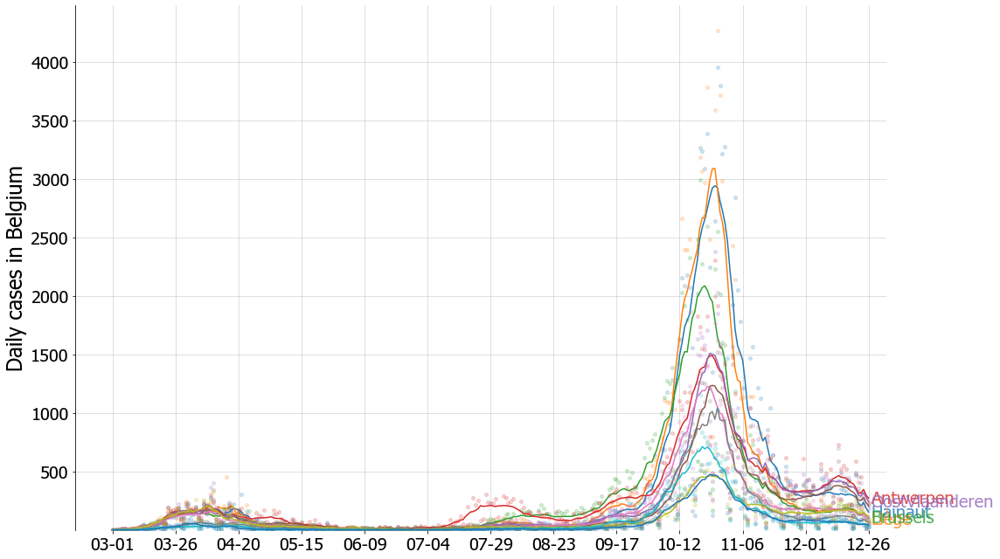

In [34]:
df = pd.read_csv('https://epistat.sciensano.be/Data/COVID19BE_CASES_AGESEX.csv')
df = df.groupby(['DATE', 'PROVINCE']).agg('sum').unstack().fillna(0).astype(int)
df.index = pd.to_datetime(df.index)
df = df[df.sum().sort_values(ascending=False).index]
df.index.rename('Belgium', inplace=True)
df.columns = df.columns.droplevel(0)

country = 'Belgium'
df = df[:-3]

# fireplot(df, country=country, split=0, labelsize=42)
# relative_fireplot(df, country=country)
lineplots_states(df, country=country, annots=5, cut_tail=0, log_scale=False, savefig=True)
# convergent_plot(df, country, annots=1, show=True, bottom=1/8)

## Czechia (old)

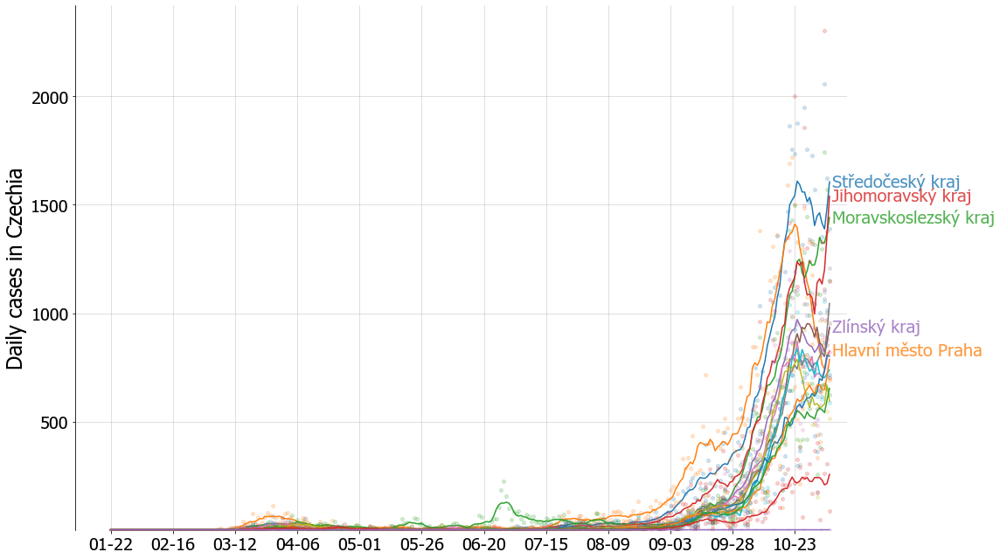

In [35]:
df = pd.read_csv('https://raw.githubusercontent.com/martin-majlis/covid-19/master/data/CSSEGISandData-COVID-19/time_series/time_series_covid19_confirmed_by_nut3.csv')
df = df.set_index('Province/State').iloc[:,3:].T
df.index = pd.to_datetime(df.index)
df = df.diff().fillna(0).astype(int)
df = df[df.sum().sort_values(ascending=False).index]

country = 'Czechia'
df = df[:-1]

# fireplot(df, country=country, split=0, labelsize=42)
# relative_fireplot(df, country=country)
lineplots_states(df, country=country, annots=5, cut_tail=0, log_scale=False, savefig=True)
# convergent_plot(df, country, annots=1, show=True, bottom=1/8)

## Austria

In [55]:
df = pd.read_csv('https://raw.githubusercontent.com/Daniel-Breuss/covid-data-austria/master/austriadata.csv')

In [56]:
df

,Datum,Fälle_gesamt,Fälle_Zuwachs,Tote_v1,Tote_v1_Zuwachs,Tote_v2,Tote_v2_Zuwachs,Genesene,Genesene_Zuwachs,Hospitalisiert,...,Vorarlberg_Genesene,Vorarlberg_Spital,Vorarlberg_Intensiv,Vorarlberg_Tests,Wien,Wien_Tote,Wien_Genesene,Wien_Spital,Wien_Intensiv,Wien_Tests
0,2020-10-25,82536,2766,979.0,14.0,984.0,6.0,51262.0,255.0,1051.0,...,2228,32,11,120047,27481,319,15076,252,66,590232
1,2020-10-24,79770,3075,965.0,11.0,978.0,7.0,50692.0,371.0,1002.0,...,2214,32,11,118567,26880,319,15076,240,69,584976
2,2020-10-23,76695,3356,954.0,13.0,971.0,14.0,49899.0,337.0,900.0,...,2203,31,9,117119,26155,317,15071,231,62,577497
3,2020-10-22,73339,2570,941.0,16.0,957.0,17.0,49156.0,363.0,841.0,...,2181,30,8,115952,25314,312,15016,229,67,569933
4,2020-10-21,70769,2355,925.0,11.0,940.0,13.0,48444.0,280.0,813.0,...,2141,25,7,115128,24648,301,14936,225,60,562746
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
239,2020-02-29,7,2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0,0,0,0,4,0,0,0,0,0
240,2020-02-28,5,2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0,0,0,0,3,0,0,0,0,0
241,2020-02-27,3,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0,0,0,0,1,0,0,0,0,0
242,2020-02-26,2,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0,0,0,0,0,0,0,0,0,0


## Iran

In [21]:
df = pd.read_csv('https://raw.githubusercontent.com/smajidi/Iran-COVID-19-Data/master/Iran_Dailly_Covid19_Stat.csv').set_index('Gregorian_Date')
df.index = pd.to_datetime(df.index).strftime('%m/%d')

(0, 44295.3)

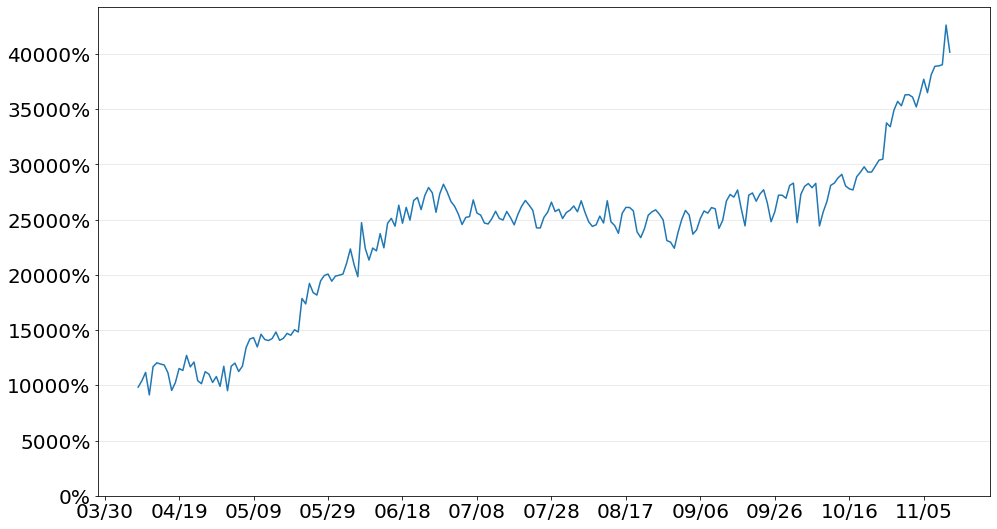

In [22]:
fig, ax = plt.subplots(figsize=(16,9))

ax.plot(df['New_Tests'])
# ax.plot(df['New_Cases']/df['New_Tests']*100, '-', alpha=0.3)
# ax.scatter(x=df.index, y=df['New_Cases']/df['New_Tests']*100, alpha=0.8, s=15)

ax.yaxis.set_major_formatter(ticker.PercentFormatter())
ax.tick_params(labelsize=20)
ax.xaxis.set_major_locator(plt.MaxNLocator(12))
ax.grid(axis='y', alpha=0.3)
ax.set_ylim(bottom=0)
# plt.savefig('figures/Daily_misc_11_12a.png', dpi=100)

## Denmark

In [28]:
df = pd.read_csv('https://raw.githubusercontent.com/mok0/covid19-data-denmark/master/covid19-data-denmark.csv').set_index('date')
df.index = pd.to_datetime(df.index)

In [29]:
df.head()

,day,tests_accum,tests_today,tested_accum,tested_today,infected_accum,infected_today,dead_accum,dead_today,recovered_accum,recovered_today,active,hospitalized_now,hospitalized_change,hospitalized_admitted,icu_now,icu_change,respirator_now,respirator_change
date,,,,,,,,,,,,,,,,,,,
2020-02-24,0,20,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2020-02-25,1,21,21,21,21,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2020-02-26,2,31,10,31,10,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2020-02-27,3,62,31,62,31,1,1,0,0,0,0,1,0,0,0,0,0,0,0
2020-02-28,4,173,111,173,111,1,0,0,0,0,0,1,0,0,0,0,0,0,0


D:\Anaconda\lib\site-packages\ipykernel_launcher.py:19: UserWarning: Legend does not support [<matplotlib.lines.Line2D object at 0x00000299ADDE48D0>] instances.
A proxy artist may be used instead.
See: http://matplotlib.org/users/legend_guide.html#creating-artists-specifically-for-adding-to-the-legend-aka-proxy-artists
D:\Anaconda\lib\site-packages\ipykernel_launcher.py:19: UserWarning: Legend does not support [<matplotlib.lines.Line2D object at 0x00000299AC371E10>] instances.
A proxy artist may be used instead.
See: http://matplotlib.org/users/legend_guide.html#creating-artists-specifically-for-adding-to-the-legend-aka-proxy-artists


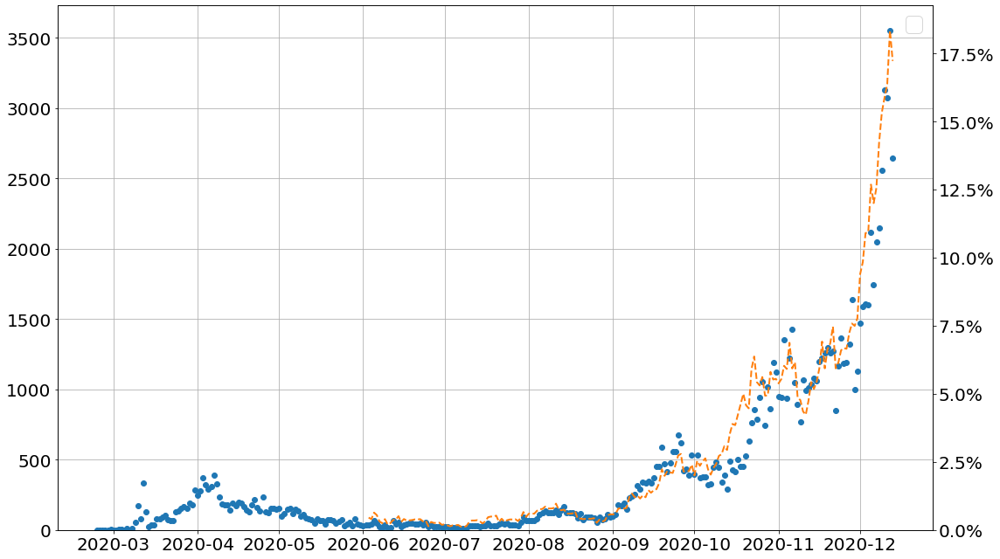

In [31]:
fig, ax = plt.subplots(figsize=(16, 9))

lns1 = ax.plot(df.infected_today, 'o', label='Daily cases in Denmark')

ax.tick_params(labelsize=20)
ax.xaxis.set_major_formatter(mdates.DateFormatter('%m/%d'))
ax.xaxis.set_major_locator(plt.MaxNLocator(12))
ax.set_ylim(bottom=0)
ax.grid()

ax2 = ax.twinx()
lns2 = ax2.plot((df.infected_today/df.tested_today*100)[100:], '--', lw=2, c='C1', label='Daily test positivity' )

ax2.set_ylim(bottom=0)
ax2.tick_params(labelsize=20)
ax2.yaxis.set_major_formatter(ticker.PercentFormatter())

labs = [l.get_label() for l in lns1+lns2]
ax.legend([lns1, lns2], labs, loc=0, fontsize=24)
plt.tight_layout()
# plt.savefig('figures/Daily_misc_12_9.png', dpi=100)

## Egypt

In [204]:
df = pd.read_csv('https://raw.githubusercontent.com/iCare-Solutions/COVID19-EgyptData/master/egypt_covid19_time_series/time_series_covid19_confirmed_egypt.csv')
df = df.set_index('Country/Region').T.iloc[3:]
df.index = pd.to_datetime(df.index)
df = df.diff().fillna(0).astype(int)
df = df[df.sum().sort_values(ascending=False).index]

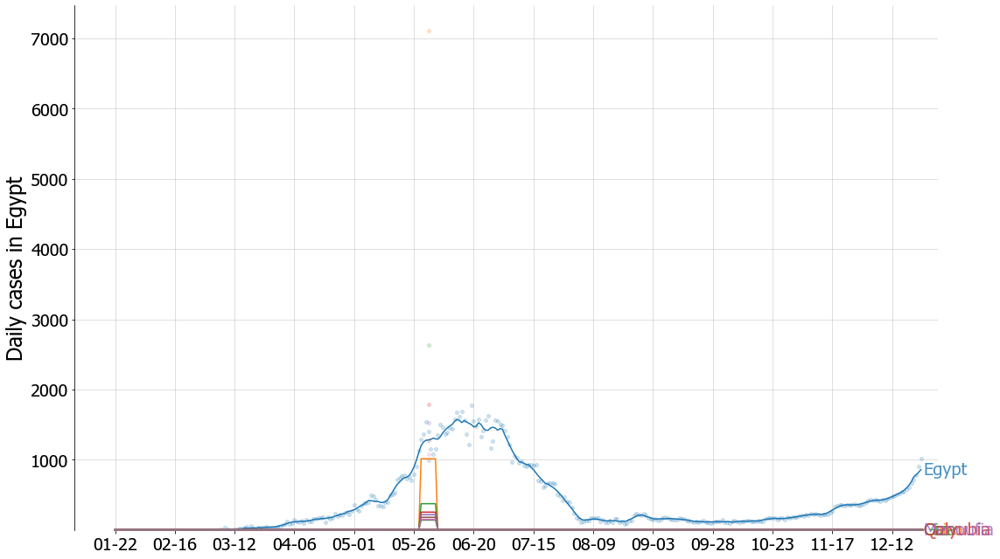

In [206]:
country = 'Egypt'
df = df[:-1]

# fireplot(df, country=country, split=0, labelsize=42)
# relative_fireplot(df, country=country)
lineplots_states(df, country=country, annots=5, cut_tail=0, log_scale=False, savefig=True)
# convergent_plot(df, country, annots=1, show=True, bottom=1/8)

# US states

In [12]:
df.sum(axis=1)

New Jersey
2020-03-04       0
2020-03-05       1
2020-03-06       1
2020-03-07       0
2020-03-08       1
              ... 
2020-11-10    3777
2020-11-11    3065
2020-11-12    3492
2020-11-13    3397
2020-11-14    4353
Length: 256, dtype: int64

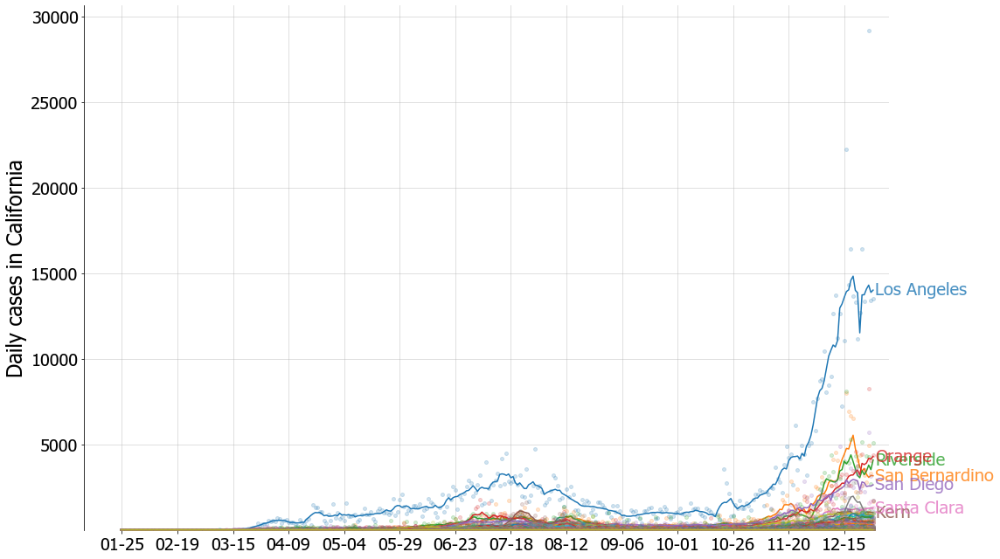

In [36]:
country = 'California'
df = pd.read_csv('https://raw.githubusercontent.com/nytimes/covid-19-data/master/us-counties.csv')
df = df[df['state']==country]
df = df.pivot(index='date',columns='county',values='cases')
df = df[df.iloc[-1].sort_values(ascending=False).index].diff()
df.index.rename(country, inplace=True)
df = df.fillna(0).astype(int)
# df = df[50:]
date = df.index[-1]

# fireplot(df, country)
# relative_fireplot(df, country)
lineplots_states(df, country=country, annots=7, cut_tail=0, log_scale=False, savefig=True)

In [145]:
# Batch generatate, takes some time to finish
df = pd.read_csv('https://raw.githubusercontent.com/nytimes/covid-19-data/master/us-states.csv')
df = df.pivot(index='date',columns='state',values='cases').iloc[32:]
df = df[df.sum().sort_values(ascending=False).index]
states = list(df)

for country in states:
    df = pd.read_csv('https://raw.githubusercontent.com/nytimes/covid-19-data/master/us-counties.csv')
    df = df[df['state']==country]
    df = df.pivot(index='date',columns='county',values='cases')
    df = df[df.iloc[-1].sort_values(ascending=False).index].diff()
    df.index.rename(country, inplace=True)
    df = df.fillna(0).astype(int)
    date = df.index[-1]

    fireplot(df, country)    

# Experimental ground

In [243]:
df = fire.copy()

In [244]:
df = df.iloc[np.argmax(df.sum(axis=1)>10):]
mean = df.copy()
mean.index = pd.to_datetime(df.index).strftime('%m-%d')

date = mean.index[-1]

for i in list(df):
    mean[i] = df[i].rolling(window=7, min_periods=1, center=True).mean().values

# t = (mean/mean.max().clip(lower=1)).T
# t['total'] = df.T.sum(axis=1)
# t = t.sort_values([list(t)[-2], 'total'])

# fig, ax=plt.subplots(figsize=(20,len(df)//3))
# cmap=sns.color_palette('RdYlGn_r', 20)
# sns.heatmap(t.iloc[:,:-1], vmin=0, vmax=1, cmap=cmap, cbar=False, xticklabels=7, ax=ax)


# ax.tick_params(left=False, labelleft=False, right=True,labelright=True,rotation=0)
# ax.set_xlabel('')
# ax.set_ylabel('')
# ax.tick_params(labelsize=20)
# plt.tight_layout()

#     # output
# if save:
#     plt.savefig('figures/Fire_relative_%s.png'%(country+'_'+date), dpi=100)
# if not show:
#     plt.close()
# print(date)